In [1]:
import qutip as qt
import numpy as np
import scipy as sp
import matplotlib
import matplotlib.pyplot as plt
import os
import math

#plt.rcParams['text.usetex'] = True
#rfont = {'fontname':'Times New Roman'}
matplotlib.rcParams.update(matplotlib.rcParamsDefault)

# Spin matrix
S0 = qt.qeye(3)                                                # {1, 0, -1}
Sx, Sy, Sz = qt.jmat(1)                                        # {1, 0, -1}
sigma0 = qt.qeye(2)                                            # {Ex, Ey}
sigmax, sigmay, sigmaz = qt.sigmax(), qt.sigmay(), qt.sigmaz() # {Ex, Ey}

# Physics constant
h             = 6.626e-34        # J/Hz
muB           = 9.274e-24 / h    # Hz/T
Des_para      = 1.42e9           # Hz       # [Doherty 2013], 1.44e9[Bassett 2014] 
Des_perp      = 1.55e9/2         # Hz       # [Doherty 2013], 1.541e9[Bassett 2014] 
lambdaes_para = 5.3e9            # Hz       # [Doherty 2013], 5.33e9[Bassett 2014]
lambdaes_perp = 0.2e9/np.sqrt(2) # Hz       # [Doherty 2013]
des_para      = 6e3              # Hz/(V/m) # [Doherty 2013]?
des_perp      = 6e3              # Hz/(V/m) # [Doherty 2013]?
les_para      = 0.1              # 1        # [Doherty 2013], 0.05[Bassett 2014] at 1.5K
ges_para      = 2.01             # 1        # [Doherty 2013], 2.15[Bassett 2014]
ges_perp      = 2.01             # 1        # [Doherty 2013]
gamma_e       = muB * ges_para

In [2]:
# bare Hamiltonian
H_es = Des_para * qt.tensor(sigma0, Sz**2 - 2/3 * S0) \
       - lambdaes_para * qt.tensor(sigmay, Sz) \
       + Des_perp * (qt.tensor(sigmaz, Sy**2 - Sx**2) - qt.tensor(sigmax, Sy * Sx + Sx * Sy)) \
       + lambdaes_perp * (qt.tensor(sigmaz, Sx * Sz + Sz * Sx) - qt.tensor(sigmax, Sy * Sz + Sz * Sy))

# Interaction Hamiltonian
def V_es(E, B, delta):
    return des_para * (E[2] + delta[2]) * qt.tensor(sigma0, S0) \
           + des_perp * (E[0] + delta[0]) * qt.tensor(sigmaz, S0) \
           - des_perp * (E[1] + delta[1]) * qt.tensor(sigmax, S0) \
           + muB * (les_para * qt.tensor(sigmay, S0) + ges_para * qt.tensor(sigma0, Sz)) * B[2] \
           + muB * ges_perp * qt.tensor(sigma0, Sx * B[0] + Sy * B[1])


### stream line

1. Decpmpose eigenstates besed on spin basis
2. Extracting the amplitude coresponded to spin basis, resoectuvily
3. Define condition value ,Xi, which can reflect how spin basis are mixed , 
4. plot the normalized Xi  , sweeping magneticfield(para) and strain(perp)

In [3]:
# Decompostion of eigenstates based on spin basis
def Decomposition(H_tot):
    ee, ev = H_tot.eigenstates()
    ev_amp = [abs(evi.full()) for evi in ev][::-1]

    return ev_amp


# condition value
def Xi(List,i,j):
    a_i = List[i]
    a_j = List[j]

    return ( abs( abs(a_i)-abs(a_j) ) )/(abs(a_i) + abs(a_j) )

def Xi_pro(List, i, j):
    a_i = List[i-1]
    a_j = List[j-1]

    return (abs(a_i))**2 * (abs(a_j))**2


# Ductionary of ES and spin basis
Es = {'|A_2>': 0,'|A_1>': 1,'|E_x>': 2,'|E_y>': 3,'|E_1>': 4,'|E_2>': 5 }
spin_basis = {'|Ex,+1>': 0,'|Ex,0>': 1,'|Ex,-1>': 2,'|Ey,+1>': 3,'|Ey,0>': 4,'|Ey,-1>': 5 }


# extraction fot key 
def get_key_from_value(d, val):
    keys = [k for k, v in d.items() if v == val]
    if keys:
        return keys[0]
    return None


key1 = get_key_from_value(spin_basis, 1)

### the corresponding relationship about ES,and spin basis respectivily

H_tot[0] => $\ket{A_2}$,H_tot[1] => $\ket{A_1}$

H_tot[2] => $\ket{E_x}$,H_tot[3] => $\ket{E_y}$,

H_tot[4] => $\ket{E_1}$,H_tot[5] => $\ket{E_2}$

Some example

H_tot[0] = [$a_1$,$a_2$,$a_3$,$a_4$,$a_5$,$a_6$]

 => $\ket{A_2}$  = $a_1 \ket{E_x,+1} + a_2 \ket{E_x,0} + a_3 \ket{E_x,-1} 
                        +  a_4 \ket{E_y,+1} + a_5 \ket{E_y,0} + a_6 \ket{E_y,-1} $

But we should be carefule of swapping betweem eigenstate's labeling due to ESLAC

In [5]:
# Prototype 

# definition of making colormap, spni_basis. Now, we assuume i, j as labeling of spin basis
def proto_colormap_spin_basis(spin_number,i,j,save_path=None):
    # Meshgrid parameters
    E = [0,0,0]
    strain_perp_values = np.linspace(0, 60e9, 100)
    Bz_values = np.linspace(0, 5000e-4, 100)

    # initialization 
    score = 0.0

    # Allocate result matrix
    xi_map = np.zeros((len(strain_perp_values), len(Bz_values)))
    #highlight_points = []

    # Evaluate Xi over parameter space
    for k, strain_perp in enumerate(strain_perp_values):
        deltax = deltay = strain_perp / np.sqrt(2) / des_perp
        strain = [deltax, deltay, 0]

        for w, Bz in enumerate(Bz_values):
            B = [0, 0, Bz]
            H_tot = H_es + V_es(E, B, strain)

            amp_list = Decomposition(H_tot)[spin_number]  # Assuming first eigenstate
            diff = Xi(amp_list, i, j)         # Xi between i and j components


            xi_map[k, w] = diff.item() if isinstance(diff, np.ndarray) else diff


        # Normalize Xi map for better visualization
    #xi_map_norm = (xi_map - xi_map.min()) / (xi_map.max() - xi_map.min())

    # Plotting the heatmap
    plt.figure(figsize=(8, 6))
    plt.imshow(xi_map, extent=
               [Bz_values[0]*1e4, Bz_values[-1]*1e4, strain_perp_values[0]/1e9, strain_perp_values[-1]/1e9, 
                                    ],
            origin='lower', aspect='auto', cmap='viridis')

    # Overlay scatter points
    #highlight_points = np.array(highlight_points)
    #if len(highlight_points) > 0:
        #plt.scatter(highlight_points[:, 0], highlight_points[:, 1],
                    #color='red', s=10, label='|a₀|^2+|a₂|^2 > 0.45')

    # converting spin_number => ES
    E_state = get_key_from_value(Es, spin_number)
    i_component = get_key_from_value(spin_basis, i)
    j_component = get_key_from_value(spin_basis, j)

    plt.colorbar(label='Normalized Xi')
    plt.xlabel('Strain_perp (GHz)')
    plt.ylabel('Bz (Gauss)')
    plt.title('Degree fo mixture of spin basis (%s vs %s component) in %s' %(i_component,j_component,E_state))
    plt.tight_layout()

     # Save or show the plot
    if save_path:
        filename = f"{save_path}/spin_mixture_{i}_{j}in_{E_state}.png"
        plt.savefig(filename)
        plt.close()
    else:
        plt.show()

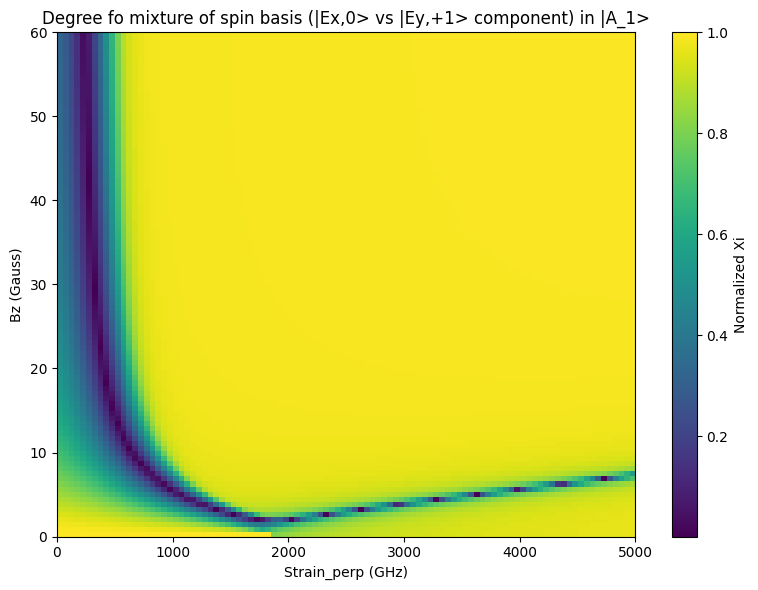

In [6]:
#{'|A_2>': 0,'|A_1>': 1,'|E_x>': 2,'|E_y>': 3,'|E_1>': 4,'|E_2>': 5 }
s = 1
proto_colormap_spin_basis(s,1,3)

In [7]:
save_dir = './colormap_outputs'
os.makedirs(save_dir, exist_ok=True)

start = 1
end = 6
for i in range(start,end + 1):
    for j in range(i,end + 1):
        if i != j:
            making_colormap_spin_basis(s, i, j, save_path=save_dir)

NameError: name 'making_colormap_spin_basis' is not defined

In [ ]:
save_dir = './colormap_outputs_$\ket{A_1}$'
os.makedirs(save_dir, exist_ok=True)
s = 1

start = 1
end = 6
for i in range(start,end):
    for j in range(i,end):
        if i != j:
            making_colormap_spin_basis(s, i, j, save_path=save_dir)

scoreをdiffの逆数にとれば、シャープな変化が読み取れるはず。
以降は スコアをdiffの逆数にした場合の関数.
問題点は下記の通り
・diffの閾値が恣意的である

In [10]:
# definition of making colormap, spni_basis. Now, we assuume i, j as labeling of spin basis
def making_colormap_spin_basis_Xi(spin_number,i,j,save_path=None):
    # Meshgrid parameters
    E = [0,0,0]
    strain_perp_values = np.linspace(0, 60e9, 1000)
    Bz_values = np.linspace(0, 5000e-4, 1000)

    # initialization 
    score = 0.0

    # Allocate result matrix
    score_map = np.zeros((len(strain_perp_values), len(Bz_values)))
    #highlight_points = []

    # Evaluate Xi over parameter space
    for k, strain_perp in enumerate(strain_perp_values):
        deltax = deltay = strain_perp / np.sqrt(2) / des_perp
        strain = [deltax, deltay, 0]

        for w, Bz in enumerate(Bz_values):
            B = [0, 0, Bz]
            H_tot = H_es + V_es(E, B, strain)

            amp_list = Decomposition(H_tot)[spin_number]  # Assuming first eigenstate
            diff = Xi(amp_list, i, j)         # Xi between i and j components
            
            if diff < 1e-2:
                diff = 1e-2
                score = abs(1e9 / diff)
         
            score = abs(1e9/diff)
            #score = np.abs(1e9/diff)

            score_map[k,w] = math.log10(score) 
            



    # Plotting the heatmap
    plt.figure(figsize=(8, 6))
    plt.imshow(score_map, extent=[Bz_values[0]*1e3, Bz_values[-1]*1e3,
                                  strain_perp_values[0]/1e9, strain_perp_values[-1]/1e9],
               origin='lower', aspect='auto', cmap='viridis')

    # Overlay scatter points
    #highlight_points = np.array(highlight_points)
    #if len(highlight_points) > 0:
        #plt.scatter(highlight_points[:, 0], highlight_points[:, 1],
                    #color='red', s=10, label='|a₀|^2+|a₂|^2 > 0.45')

    # converting spin_number => ES
    E_state = get_key_from_value(Es, spin_number)
    i_component = get_key_from_value(spin_basis, i)
    j_component = get_key_from_value(spin_basis, j)

    plt.colorbar(label='score $abs(a_i)+abs(a_j)/(abs(a_i)-abs(a_j))$')
    plt.xlabel('Bz (mT)')
    plt.ylabel('Strain_perp (GHz)')
    plt.title('Degree fo mixture of spin basis (%s vs %s component) in %s' %(i_component,j_component,E_state))
    plt.tight_layout()

     # Save or show the plot
    if save_path:
        filename = f"{save_path}/spin_mixture_{i}_{j}in_{E_state}.png"
        plt.savefig(filename)
        plt.close()
    else:
        plt.show()

In [11]:
# definition of making colormap, spni_basis. Now, we assuume i, j as labeling of spin basis
def making_colormap_spin_basis_Xi_pro(spin_number, i, j, save_path=None):
    # Meshgrid parameters
    E = [0,0,0]
    strain_perp_values = np.linspace(0, 60e9, 1000)
    Bz_values = np.linspace(0, 5000e-4, 1000)

    # initialization 
    score = 0.0

    # Allocate result matrix
    score_map = np.zeros((len(strain_perp_values), len(Bz_values)))
    #highlight_points = []

    # Evaluate Xi over parameter space
    for k, strain_perp in enumerate(strain_perp_values):
        deltax = deltay = strain_perp / np.sqrt(2) / des_perp
        strain = [deltax, deltay, 0]

        for w, Bz in enumerate(Bz_values):
            B = [0, 0, Bz]
            H_tot = H_es + V_es(E, B, strain)

            amp_list = Decomposition(H_tot)[spin_number]  # Assuming first eigenstate
            diff = Xi_pro(amp_list, i, j)         # Xi between i and j components
            score = diff
            score_map[k,w] = score 
            



    # Plotting the heatmap
    plt.figure(figsize=(8, 6))
    plt.imshow(score_map/0.25, extent=[Bz_values[0]*1e3, Bz_values[-1]*1e3,
                                       strain_perp_values[0]/1e9, strain_perp_values[-1]/1e9],
               origin='lower', aspect='auto', cmap='viridis', 
               vmin=0, vmax=1.0)

    # Overlay scatter points
    #highlight_points = np.array(highlight_points)
    #if len(highlight_points) > 0:
        #plt.scatter(highlight_points[:, 0], highlight_points[:, 1],
                    #color='red', s=10, label='|a₀|^2+|a₂|^2 > 0.45')

    # converting spin_number => ES
    E_state = get_key_from_value(Es, spin_number)
    i_component = get_key_from_value(spin_basis, i)
    j_component = get_key_from_value(spin_basis, j)

    plt.colorbar(label='score $abs(a_i)^2 * abs(a_j)^2$')
    plt.xlabel('Bz (mT)')
    plt.ylabel('Strain_perp (GHz)')
    plt.title('Degree fo mixture of spin basis (%s vs %s component) in %s' %(i_component,j_component,E_state))
    plt.tight_layout()

     # Save or show the plot
    if save_path:
        filename = f"{save_path}/spin_mixture_{i}_{j}in_{E_state}.png"
        plt.savefig(filename)
        plt.close()
    else:
        plt.show()

C:\Users\Tsuchiya Saki\AppData\Local\Temp\ipykernel_35476\2124091490.py:34: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  score_map[k,w] = math.log10(score)


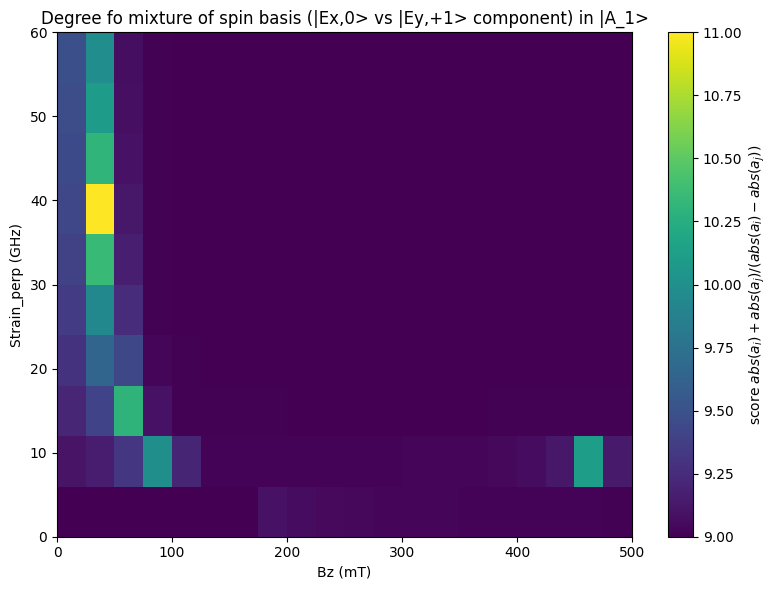

C:\Users\Tsuchiya Saki\AppData\Local\Temp\ipykernel_35476\2369298437.py:27: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  score_map[k,w] = score


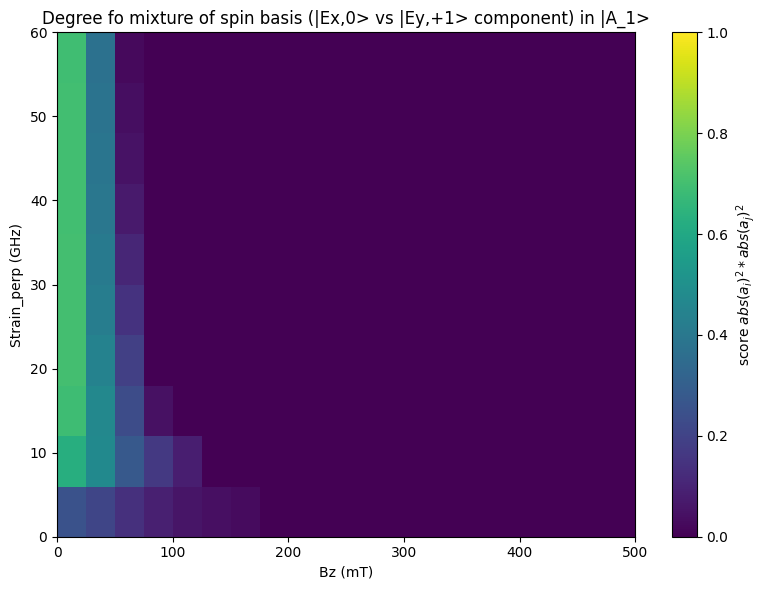

In [9]:
#{'|A_2>': 0,'|A_1>': 1,'|E_x>': 2,'|E_y>': 3,'|E_1>': 4,'|E_2>': 5 }
s = 1
making_colormap_spin_basis_Xi(s,1,3)
making_colormap_spin_basis_Xi_pro(s, 1, 3)

C:\Users\Tsuchiya Saki\AppData\Local\Temp\ipykernel_35476\3138478702.py:34: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  score_map[k,w] = math.log10(score)


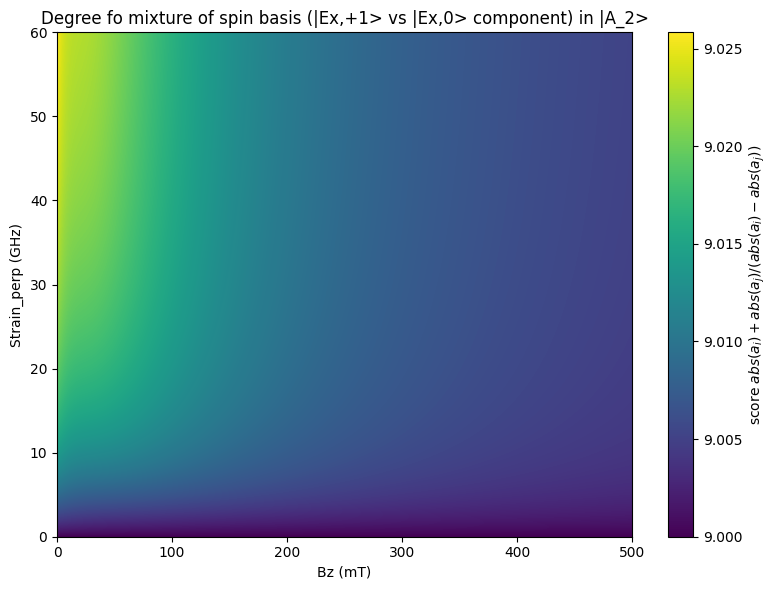

C:\Users\Tsuchiya Saki\AppData\Local\Temp\ipykernel_35476\1404137840.py:27: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  score_map[k,w] = score


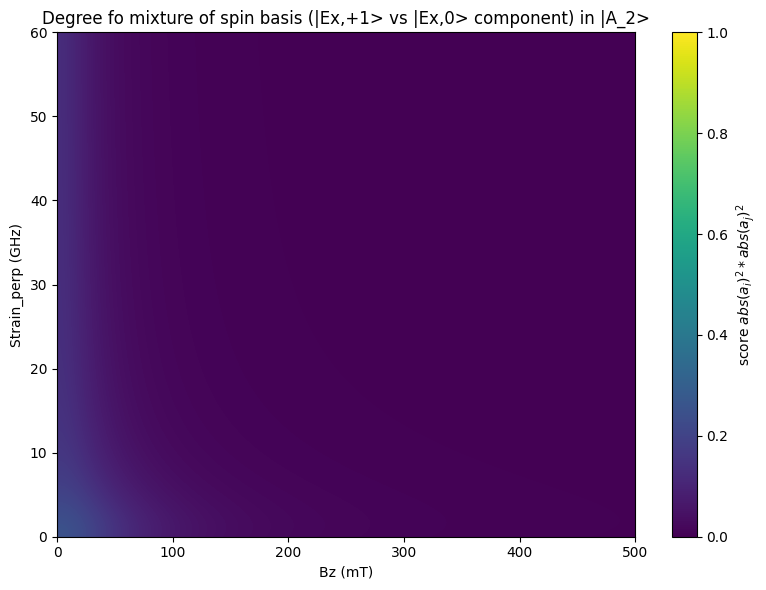

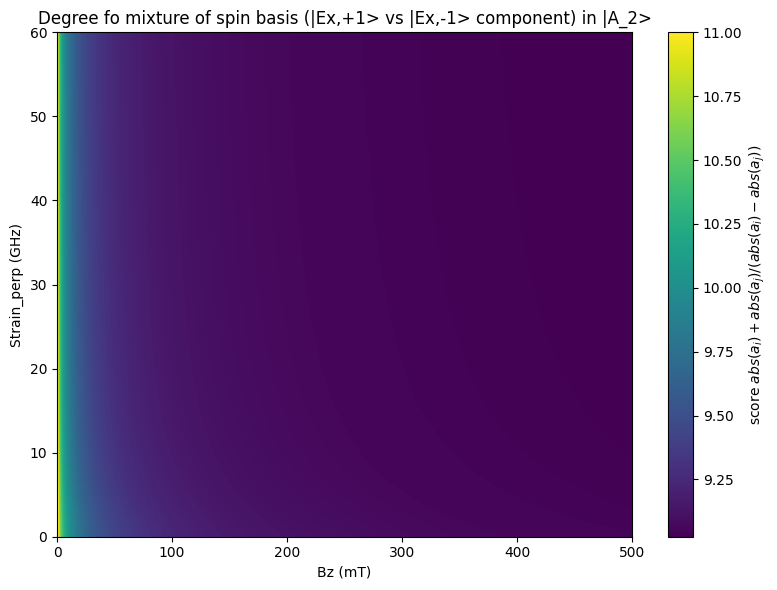

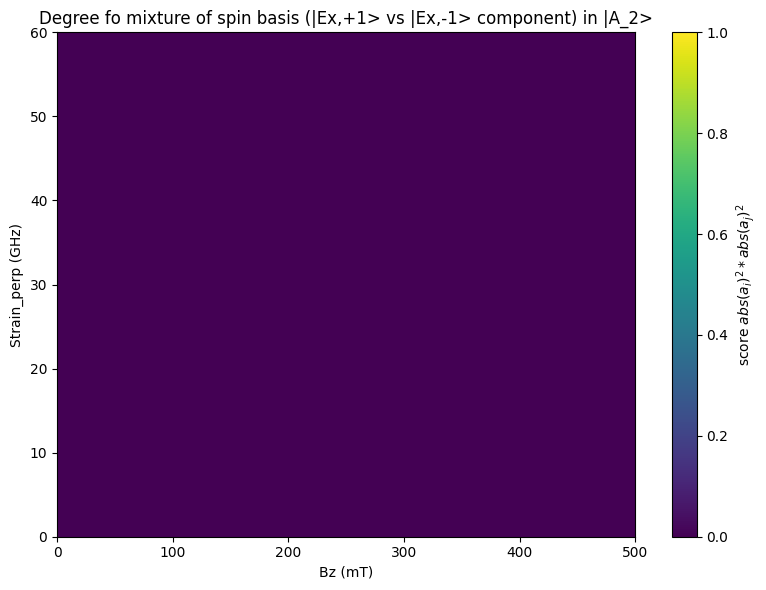

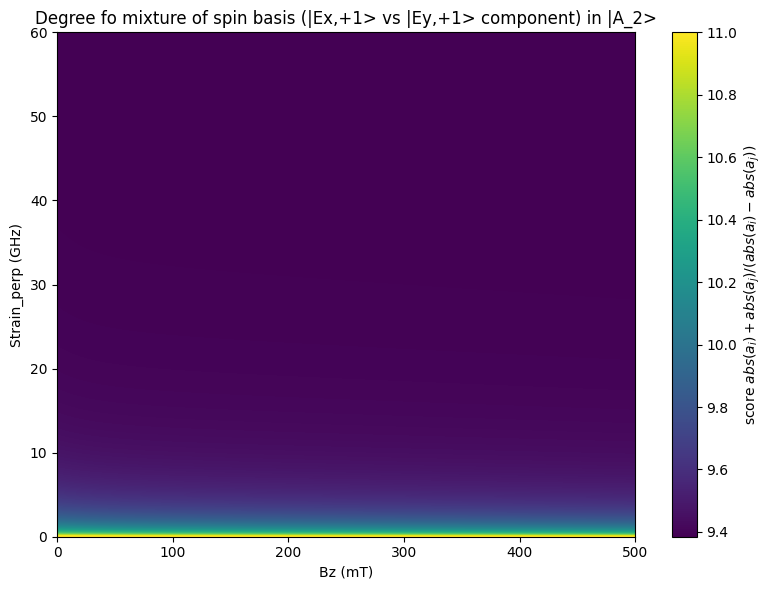

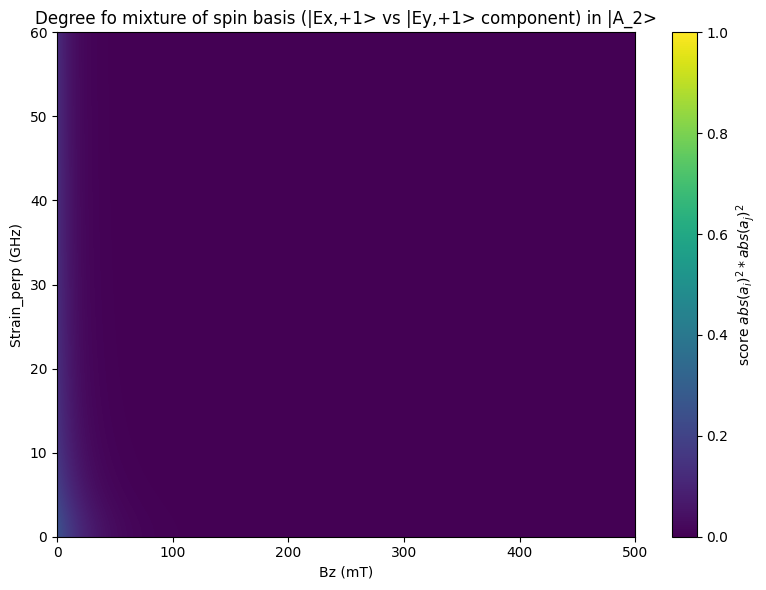

...

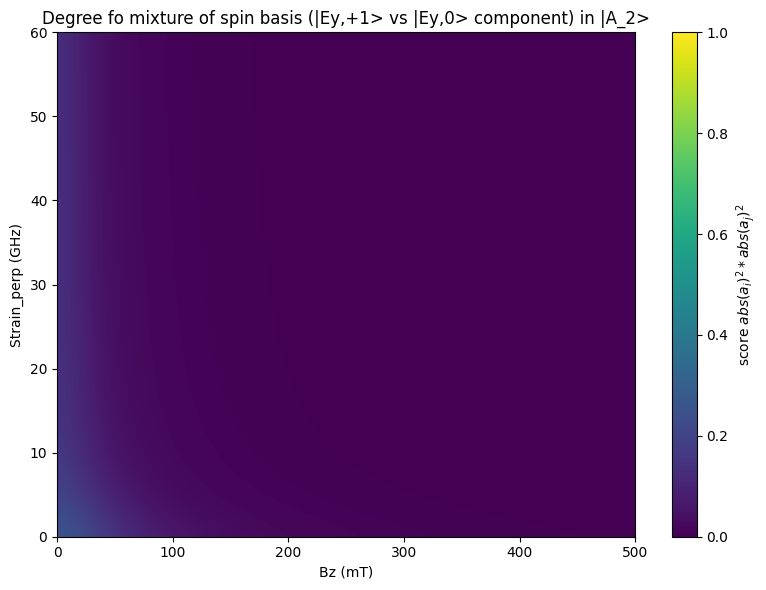

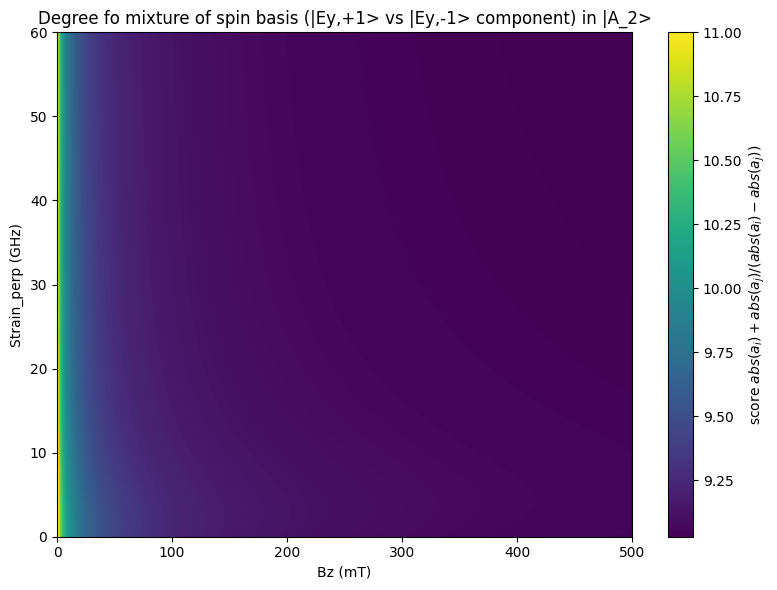

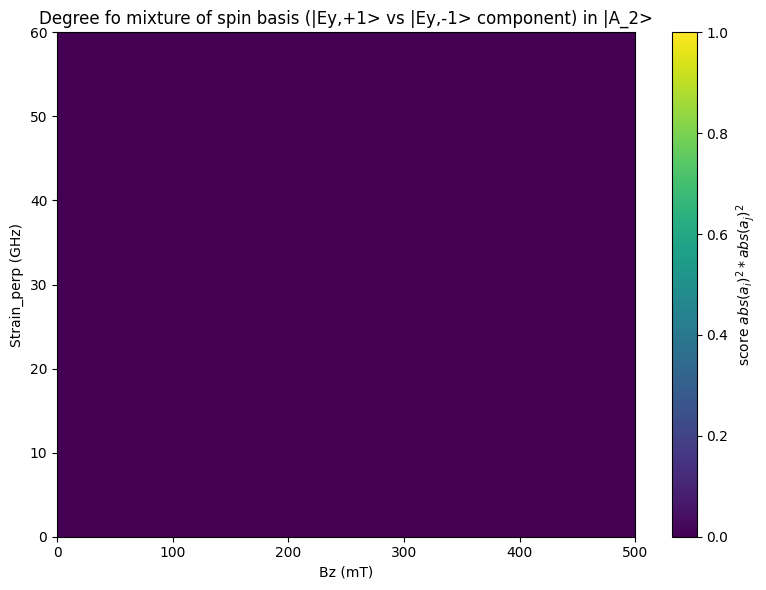

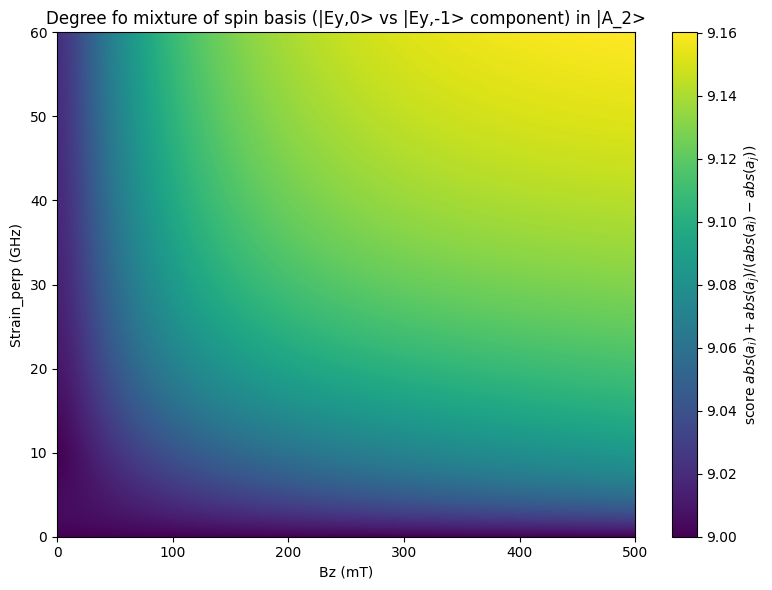

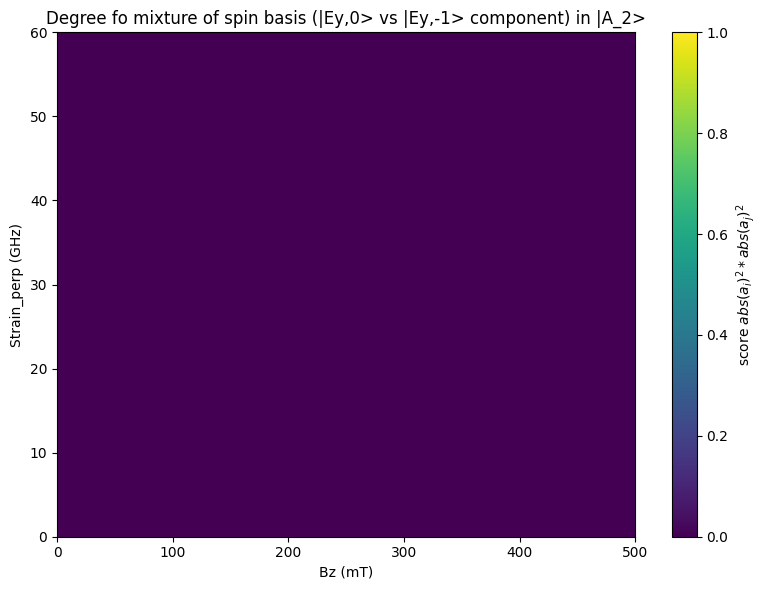

In [12]:
s = 0
for i in range(0,6):
    for j in range(i,6):
        if i != j:
            making_colormap_spin_basis_Xi(s, i, j)
            making_colormap_spin_basis_Xi_pro(s, i, j)

C:\Users\Tsuchiya Saki\AppData\Local\Temp\ipykernel_35476\3138478702.py:34: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  score_map[k,w] = math.log10(score)


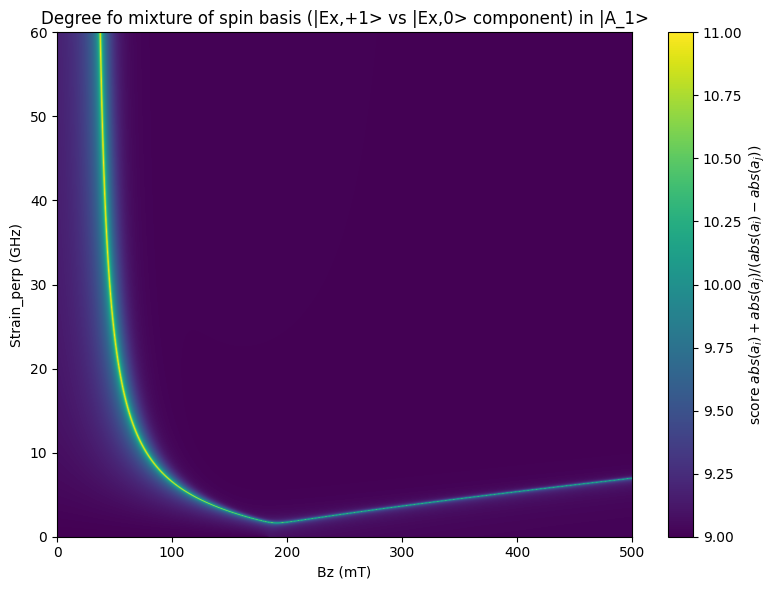

C:\Users\Tsuchiya Saki\AppData\Local\Temp\ipykernel_35476\1404137840.py:27: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  score_map[k,w] = score


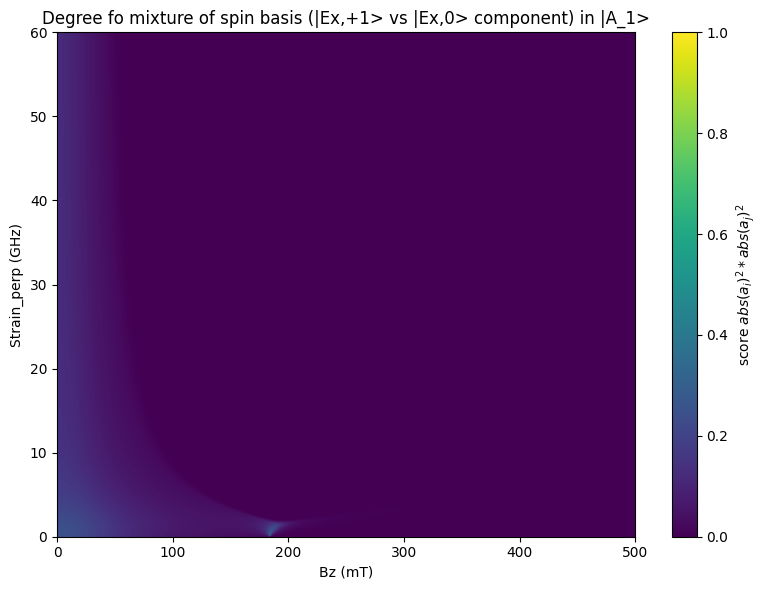

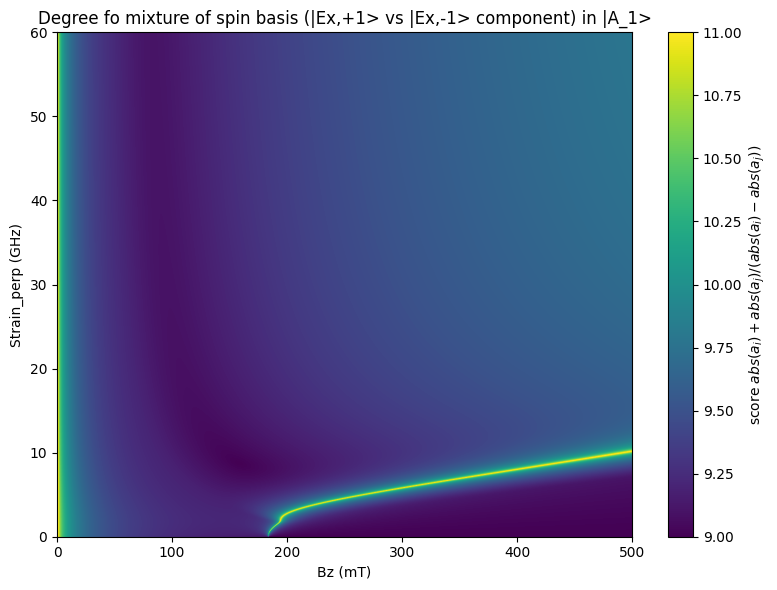

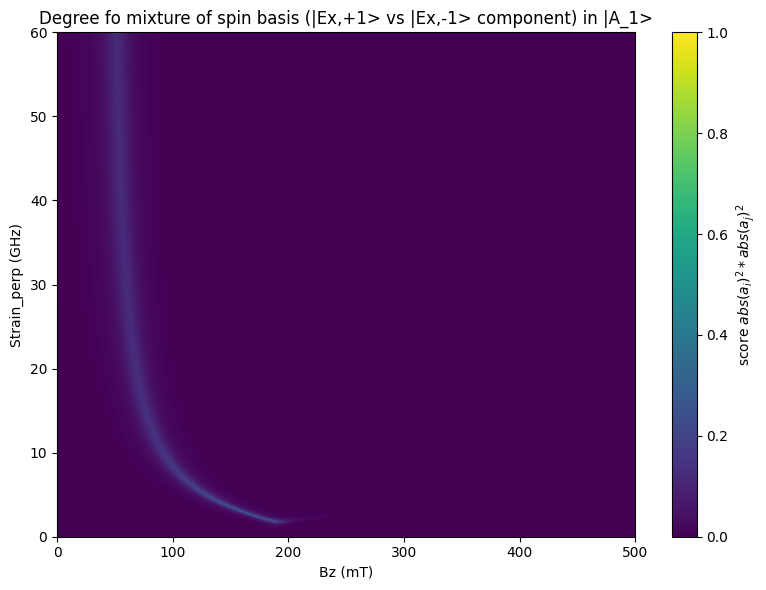

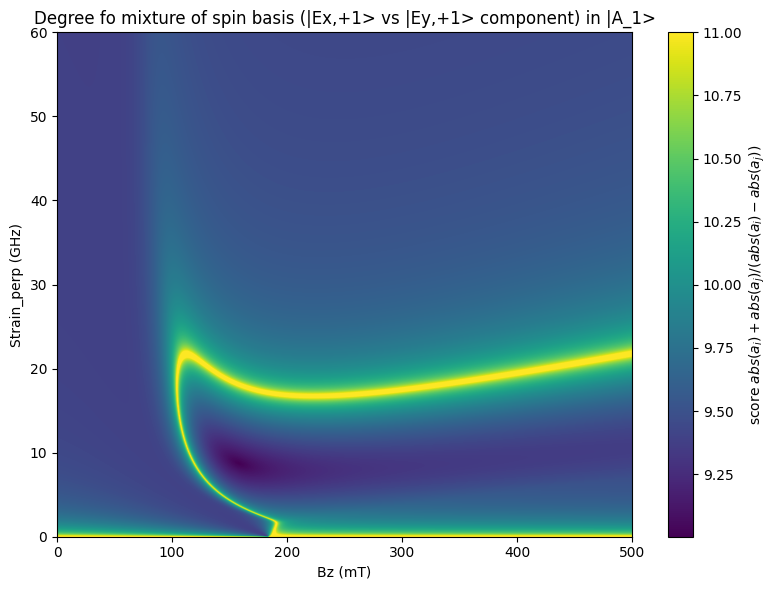

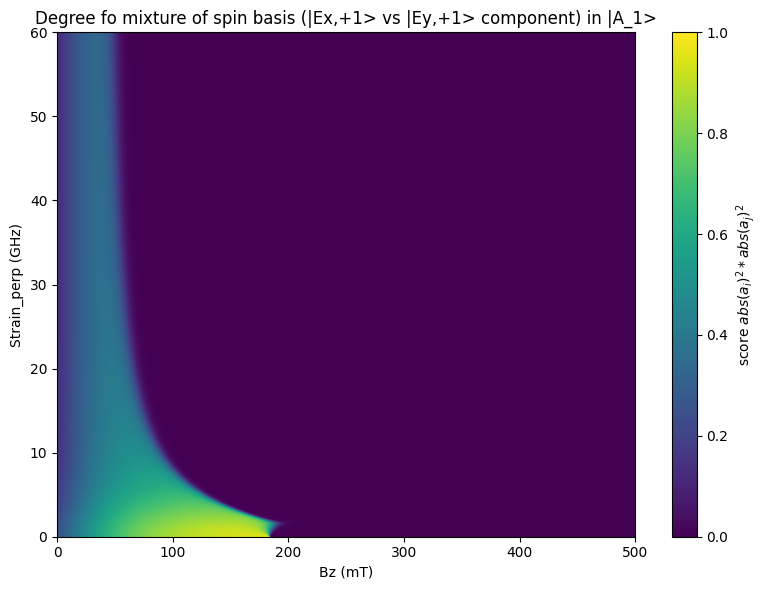

...

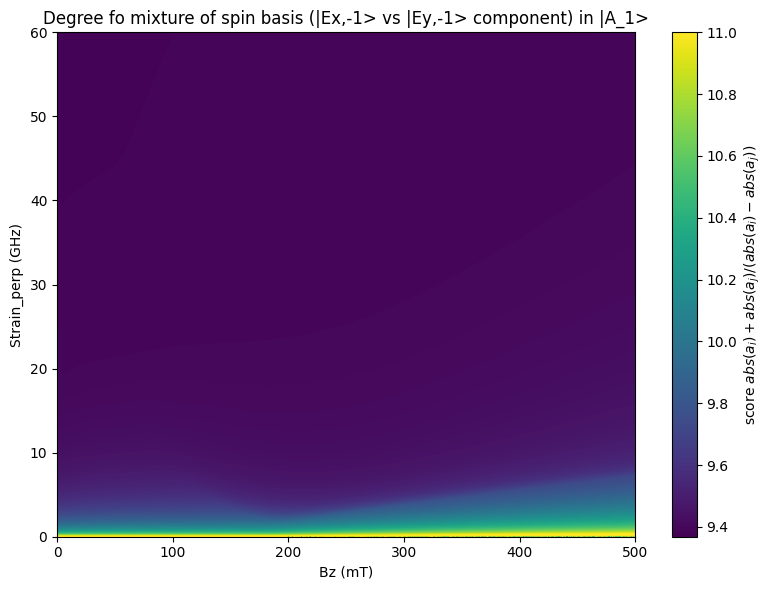

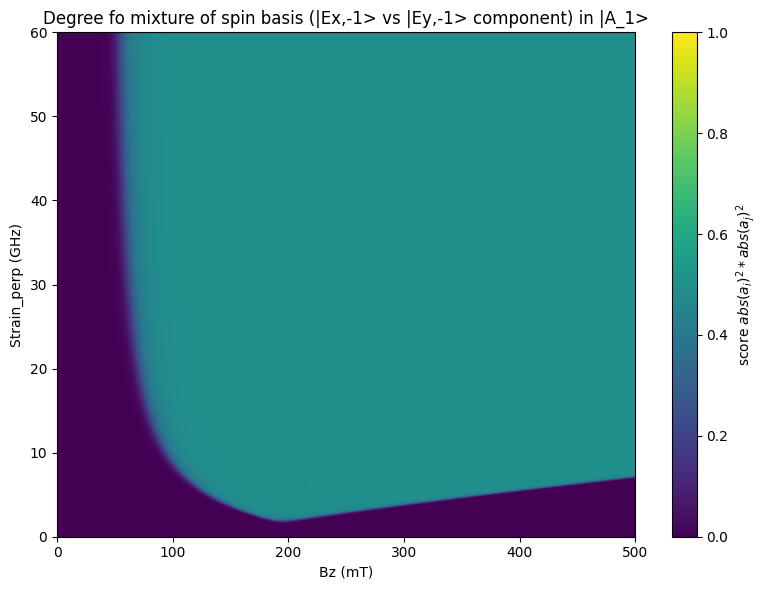

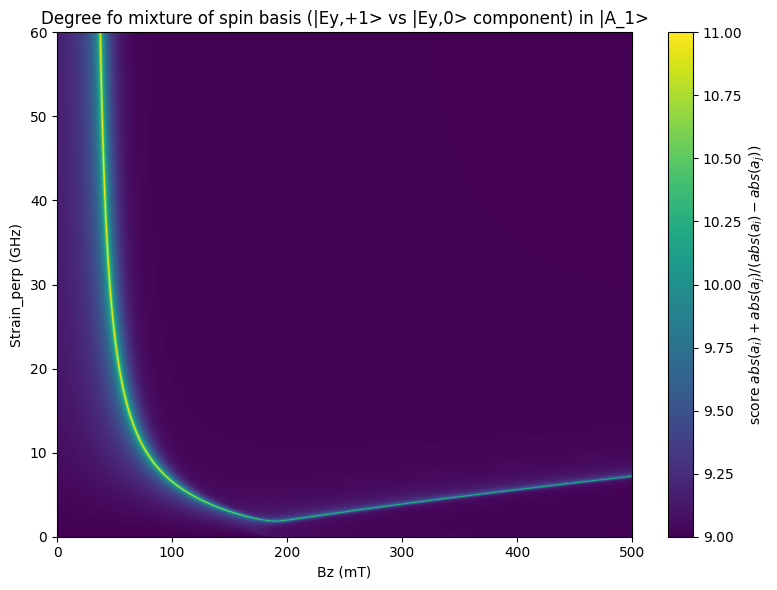

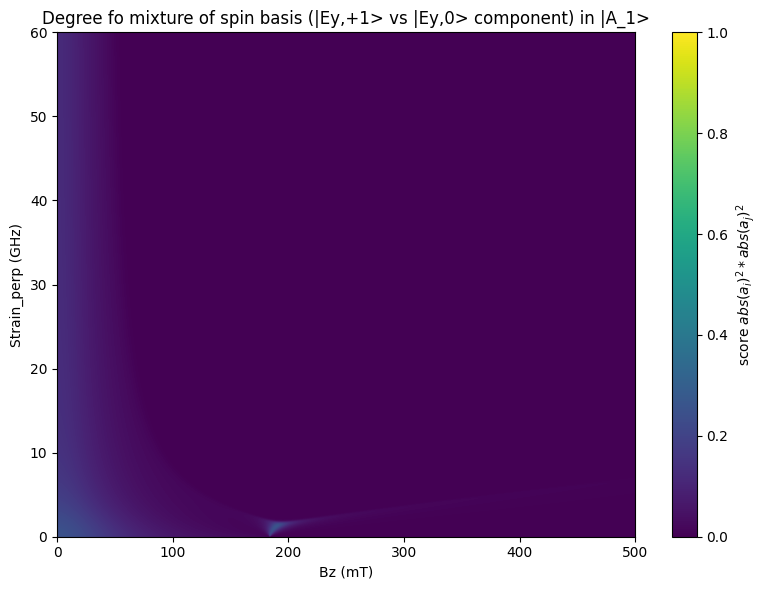

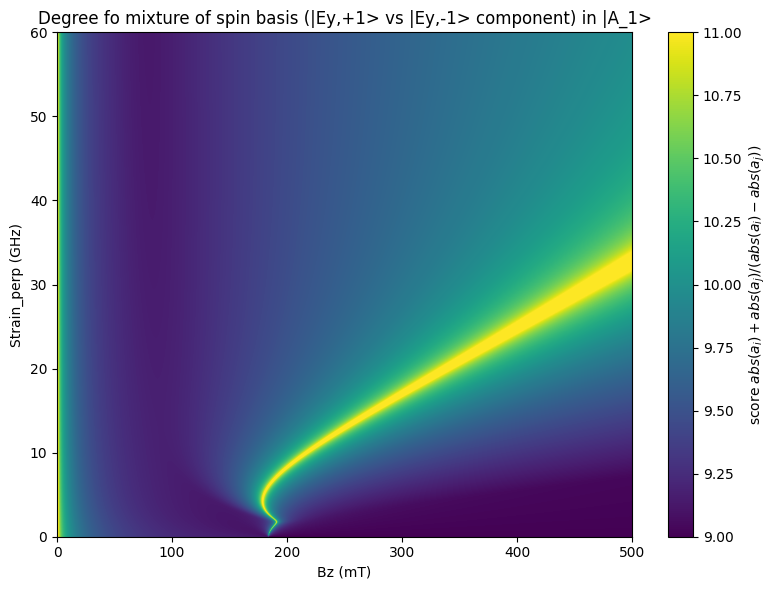

In [ ]:
s = 1
for i in range(0,6):
    for j in range(i,6):
        if i != j:
            making_colormap_spin_basis_Xi(s, i, j)
            making_colormap_spin_basis_Xi_pro(s, i, j)

C:\Users\Tsuchiya Saki\AppData\Local\Temp\ipykernel_23084\4038930024.py:34: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  score_map[k,w] = math.log10(score)


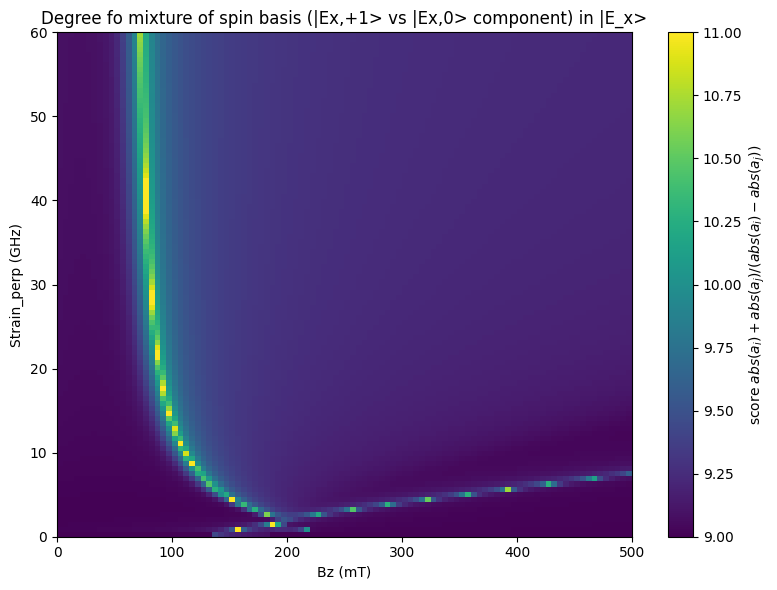

C:\Users\Tsuchiya Saki\AppData\Local\Temp\ipykernel_23084\88169367.py:27: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  score_map[k,w] = score


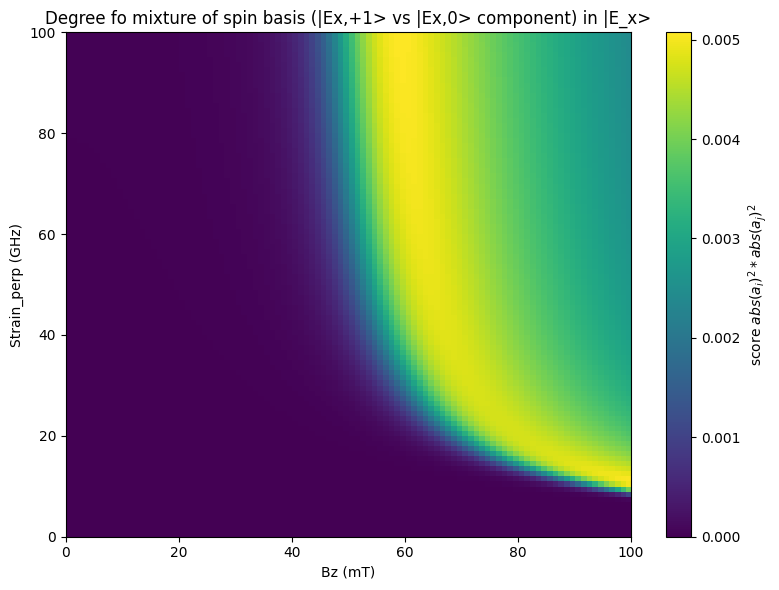

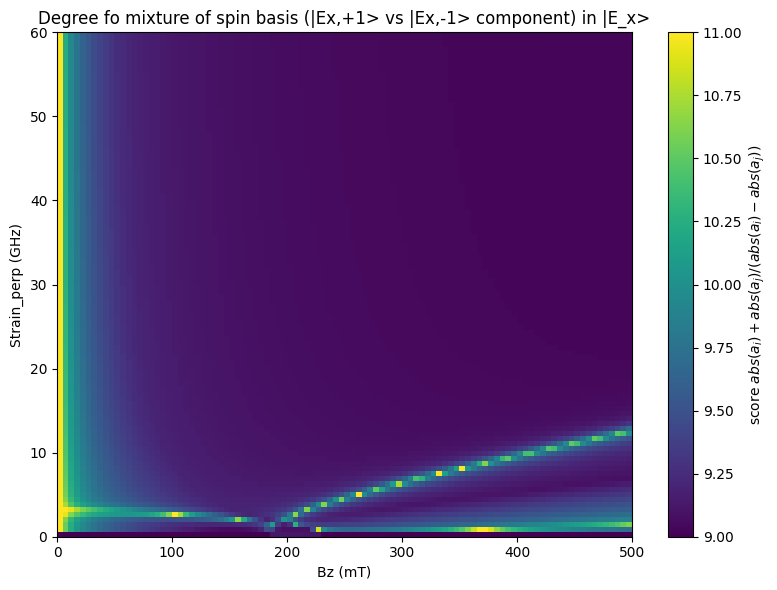

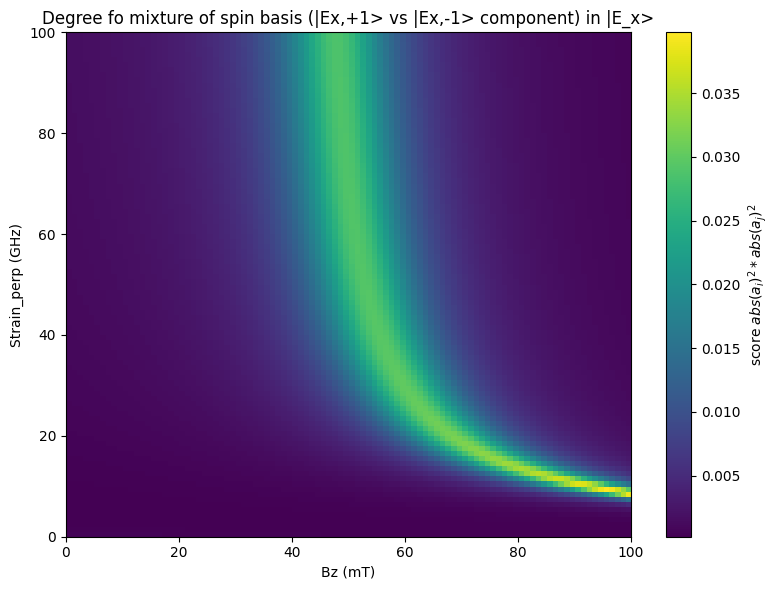

C:\Users\Tsuchiya Saki\AppData\Local\Temp\ipykernel_23084\1790684943.py:14: RuntimeWarning: invalid value encountered in divide
  return ( abs( abs(a_i)-abs(a_j) ) )/(abs(a_i) + abs(a_j) )


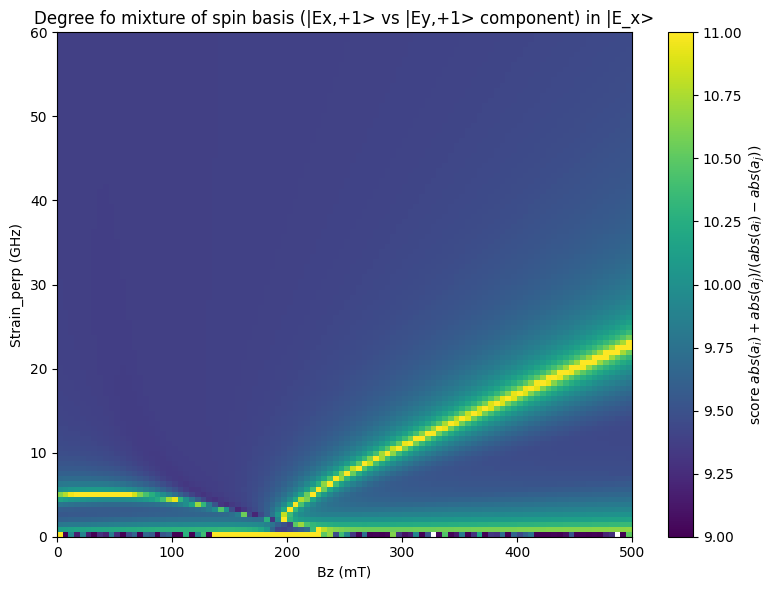

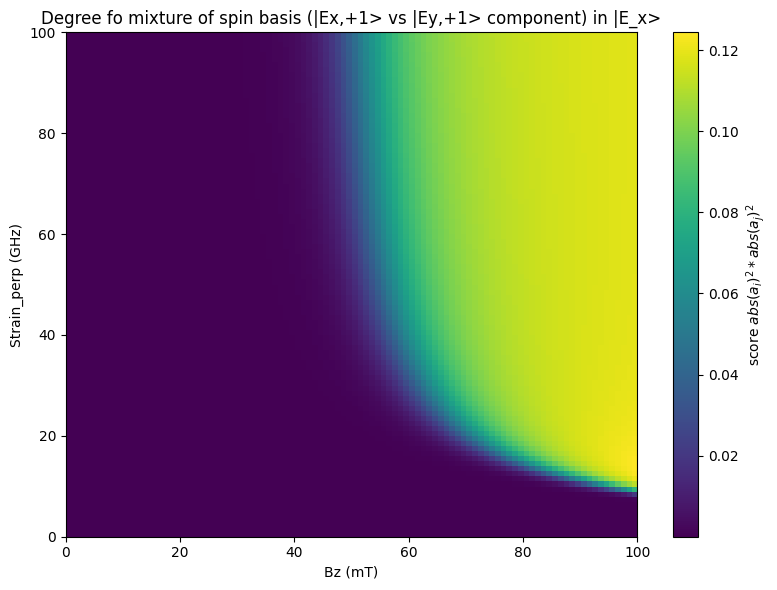

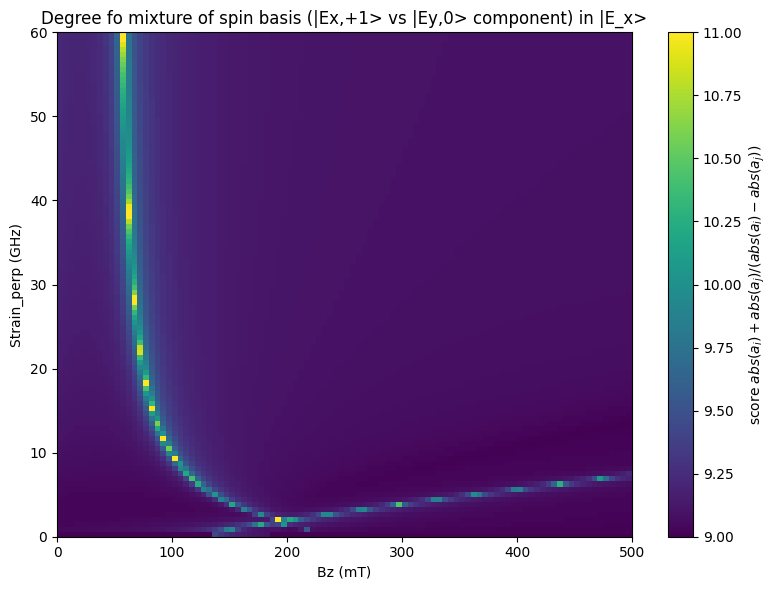

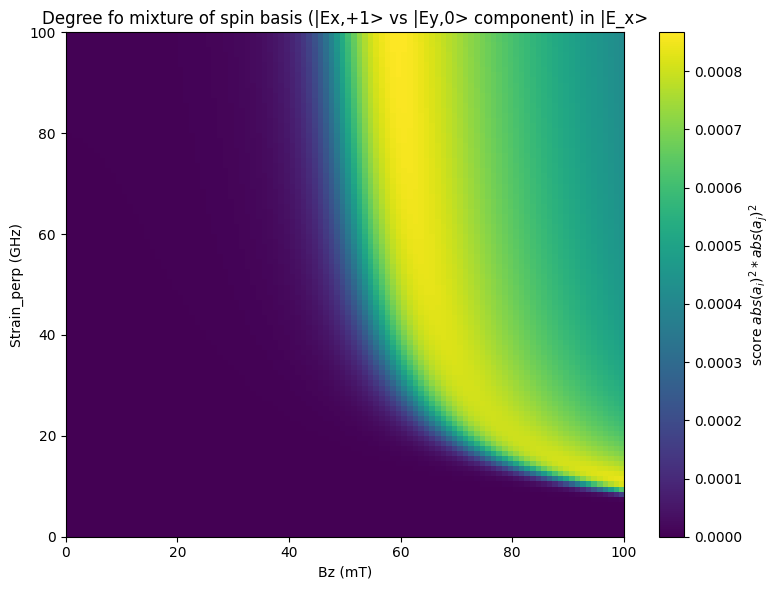

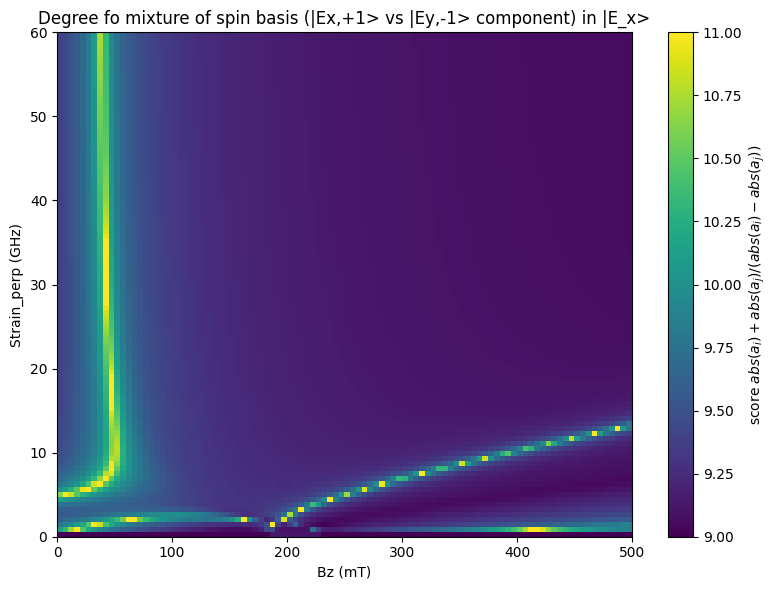

...

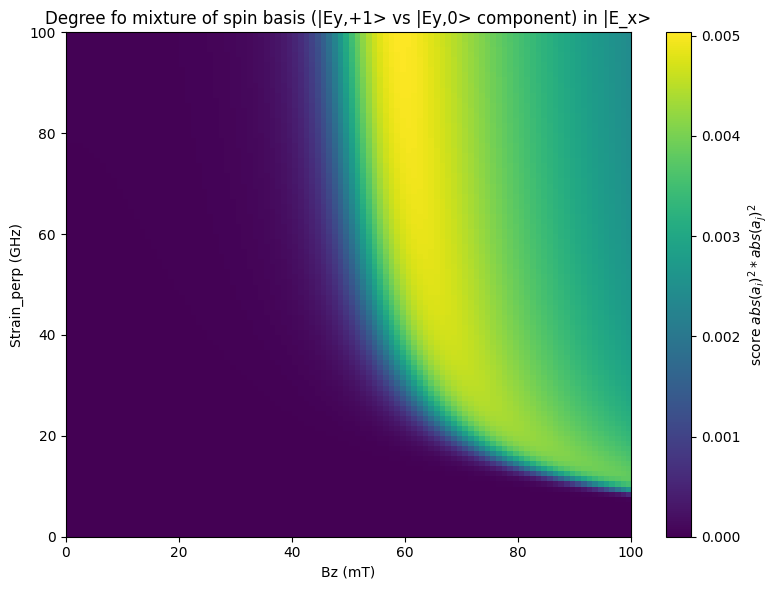

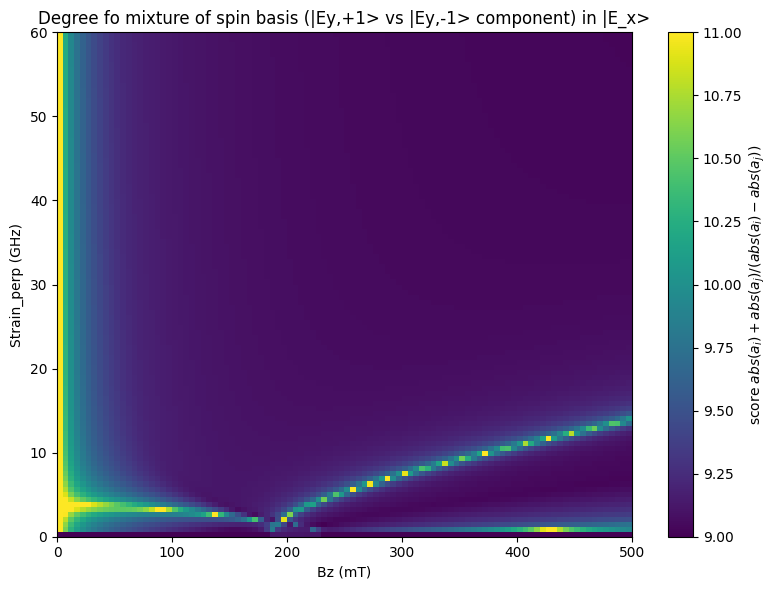

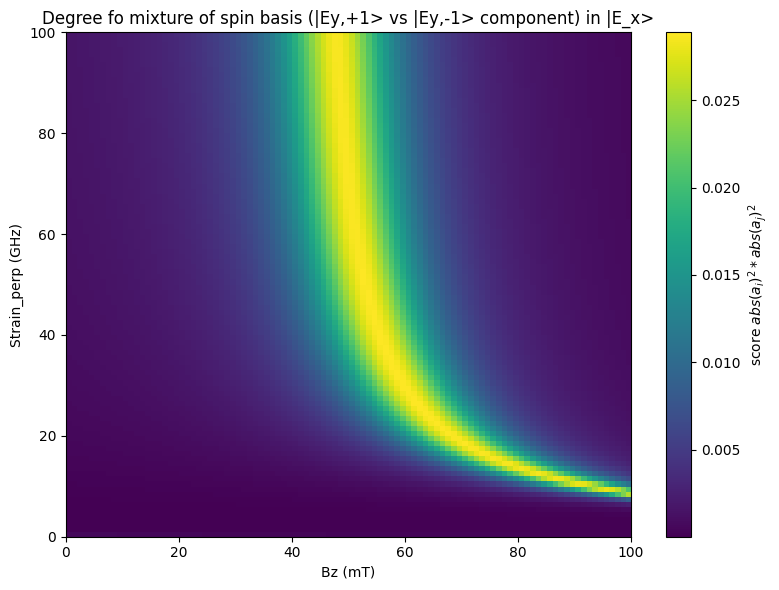

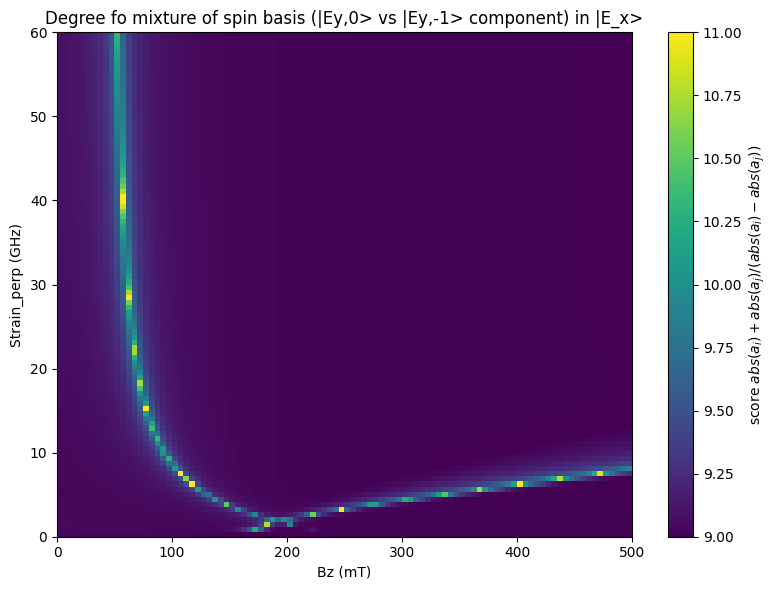

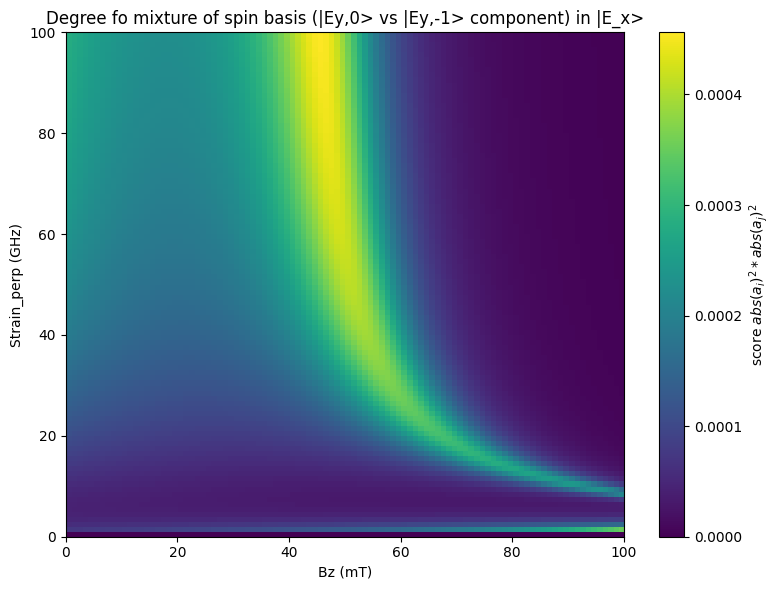

In [ ]:
s = 2
for i in range(0,6):
    for j in range(i,6):
        if i != j:
            making_colormap_spin_basis_Xi(s, i, j)
            making_colormap_spin_basis_Xi_pro(s, i, j)

C:\Users\Tsuchiya Saki\AppData\Local\Temp\ipykernel_23084\4038930024.py:34: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  score_map[k,w] = math.log10(score)


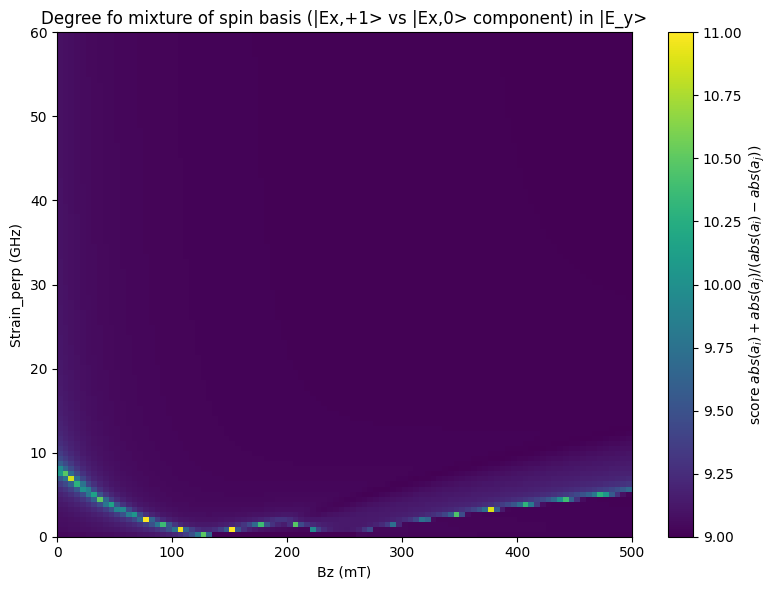

C:\Users\Tsuchiya Saki\AppData\Local\Temp\ipykernel_23084\88169367.py:27: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  score_map[k,w] = score


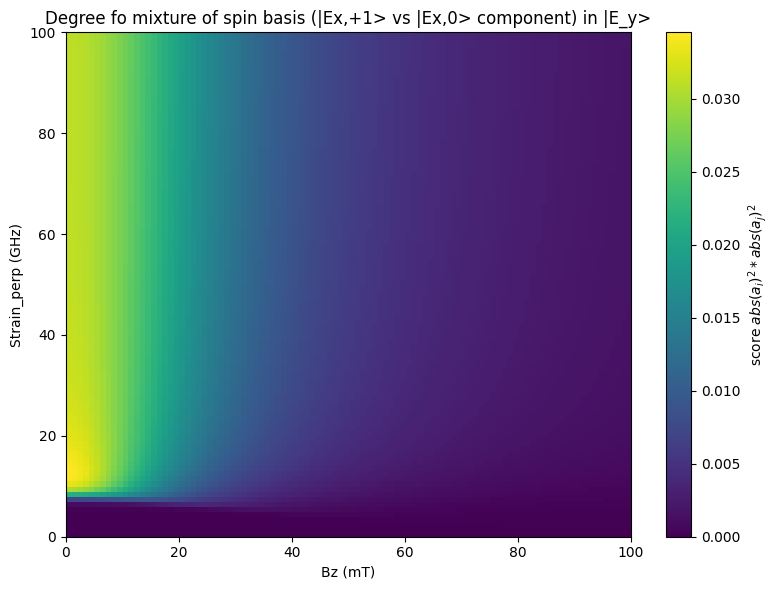

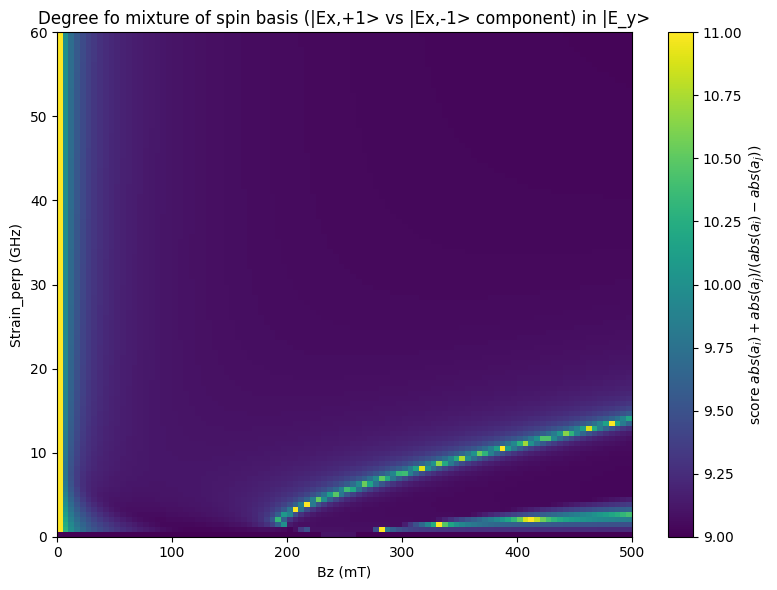

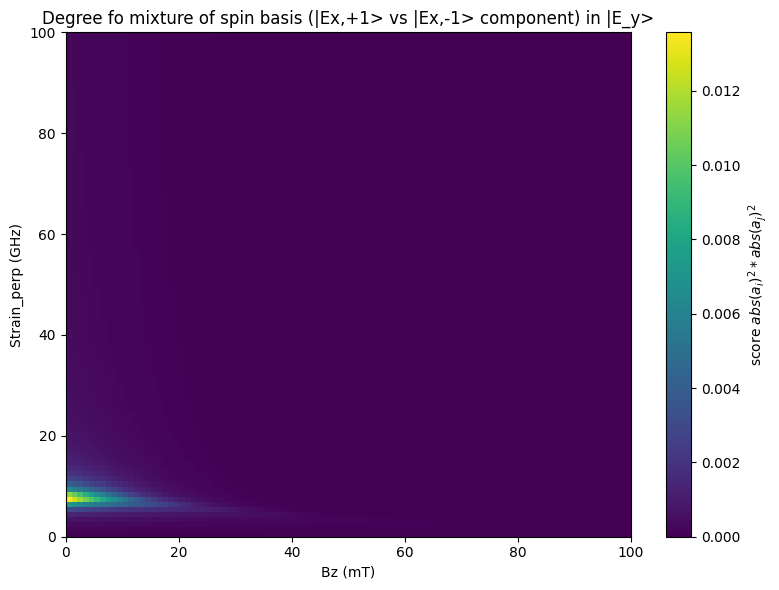

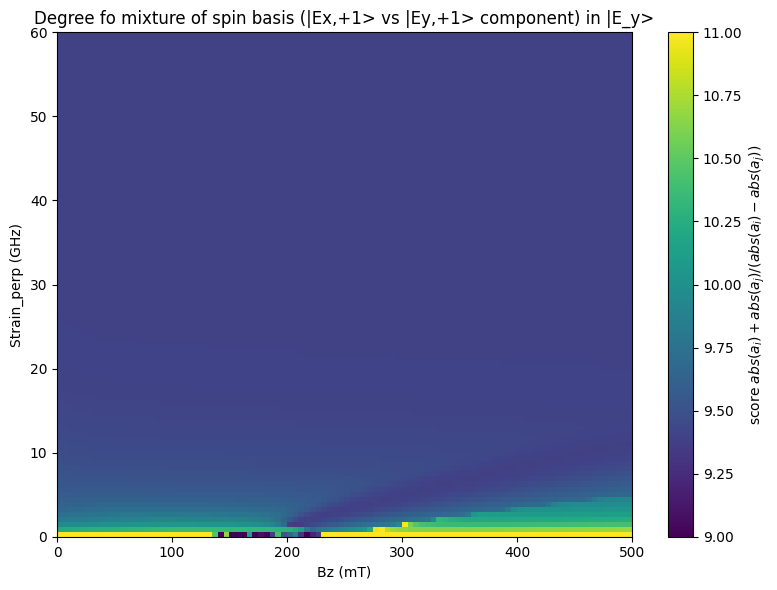

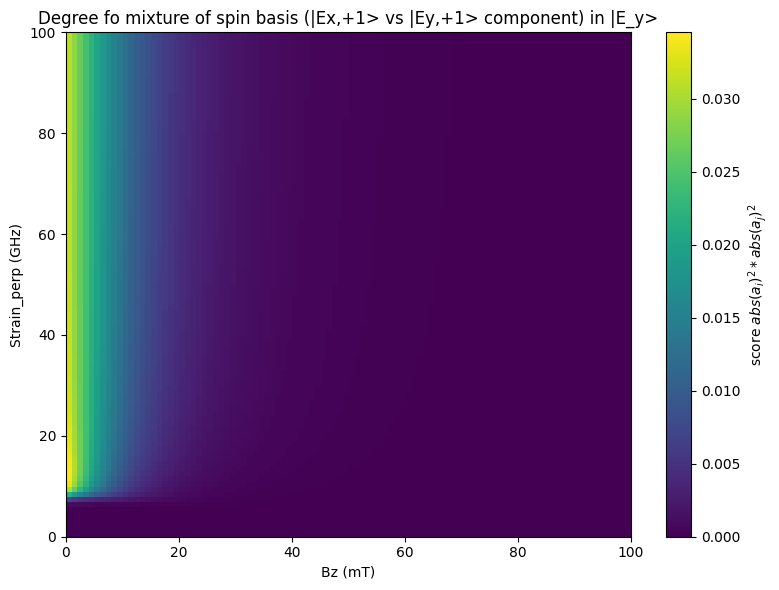

...

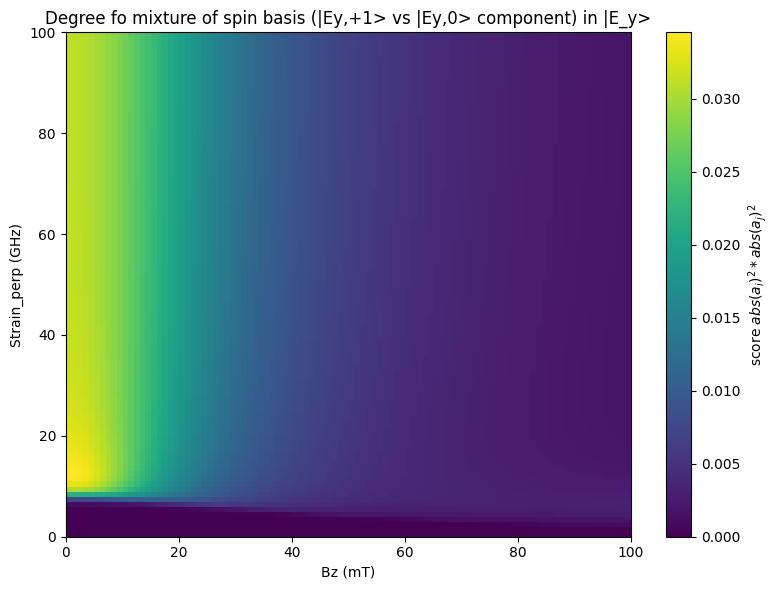

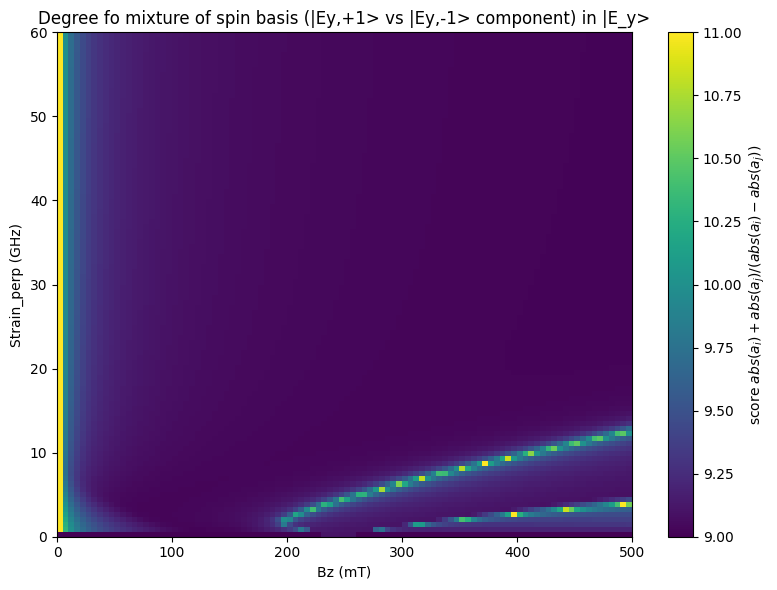

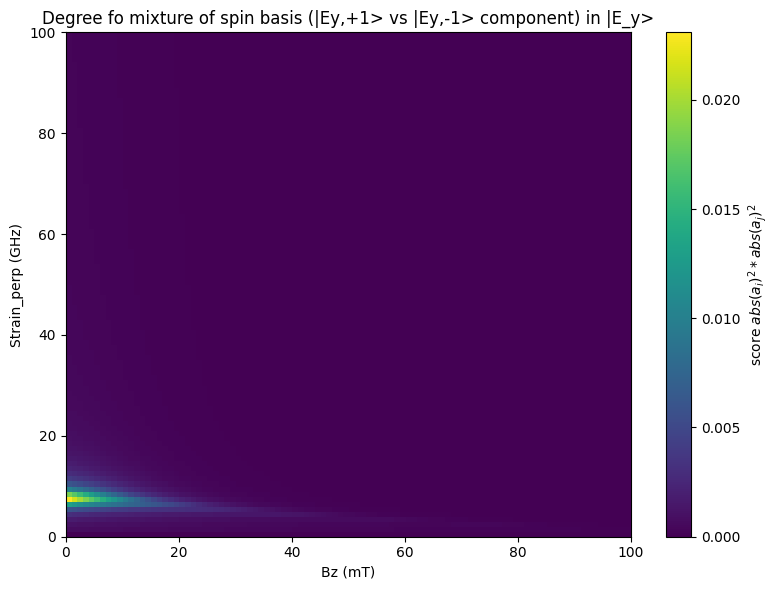

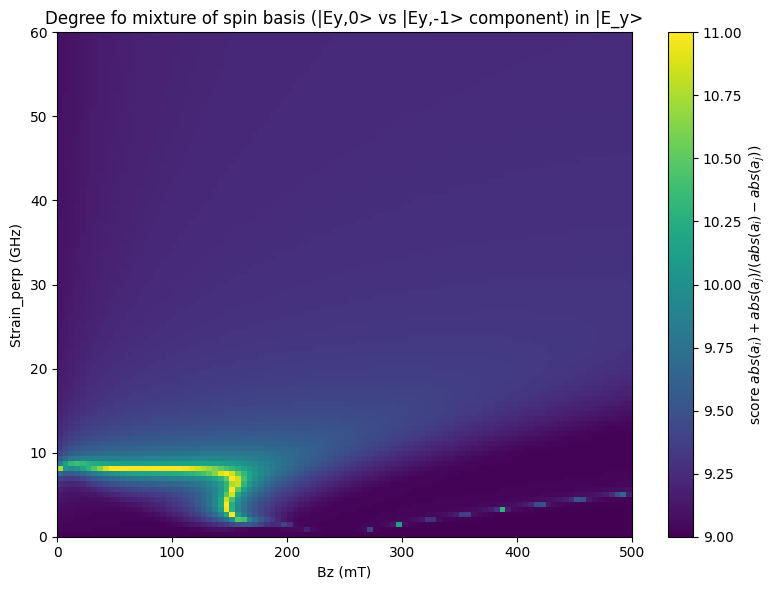

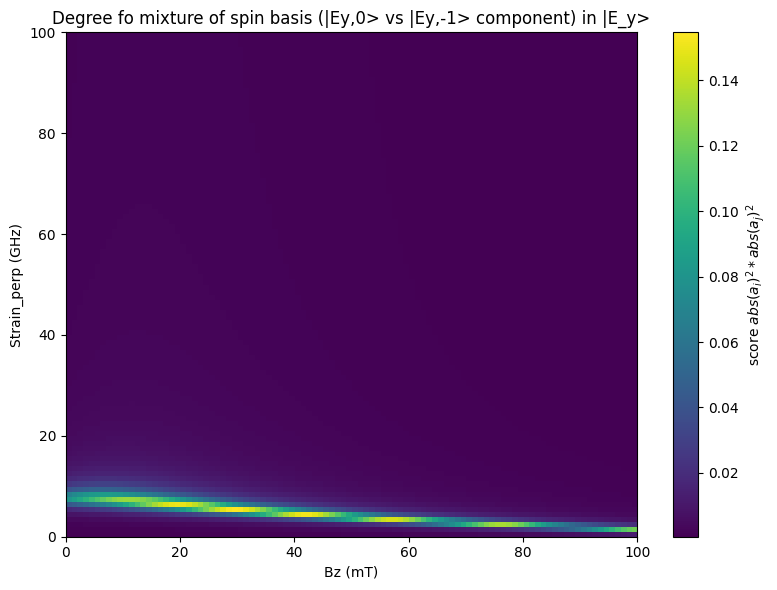

In [ ]:
s = 3
for i in range(0,6):
    for j in range(i,6):
        if i != j:
            making_colormap_spin_basis_Xi(s, i, j)
            making_colormap_spin_basis_Xi_pro(s, i, j)

C:\Users\Tsuchiya Saki\AppData\Local\Temp\ipykernel_23084\4038930024.py:34: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  score_map[k,w] = math.log10(score)


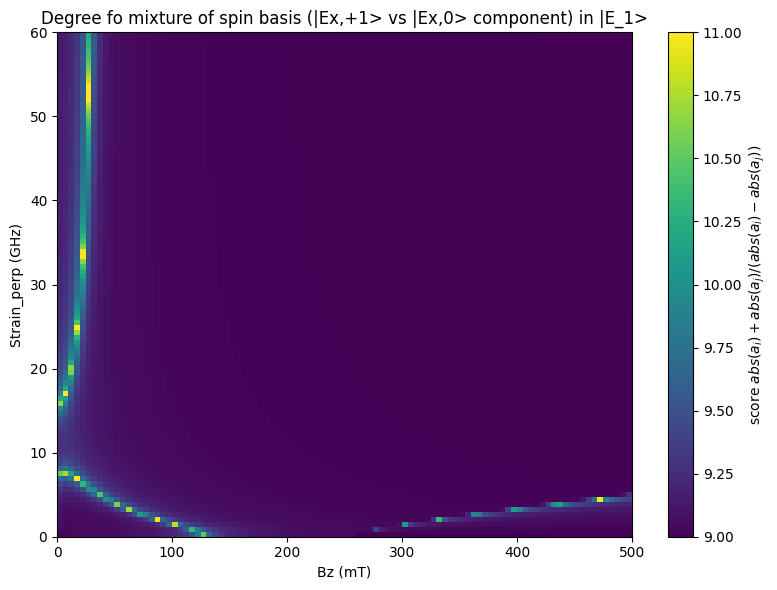

C:\Users\Tsuchiya Saki\AppData\Local\Temp\ipykernel_23084\88169367.py:27: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  score_map[k,w] = score


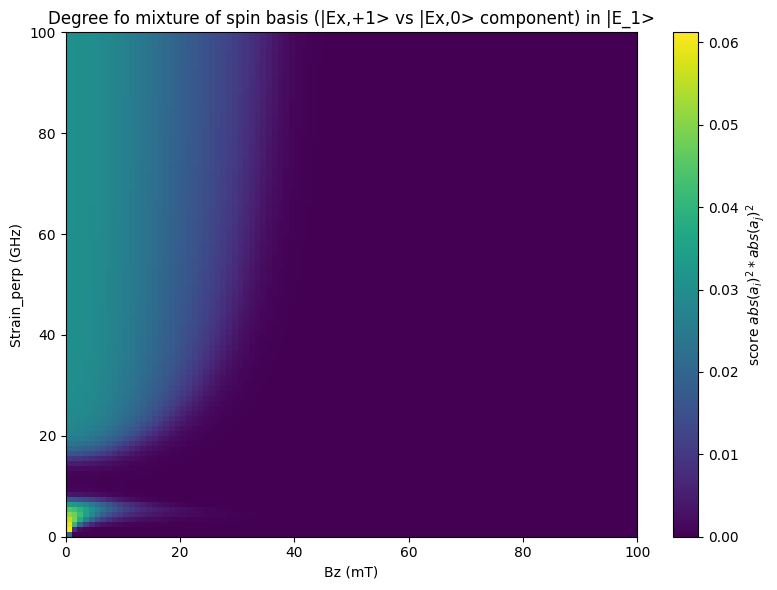

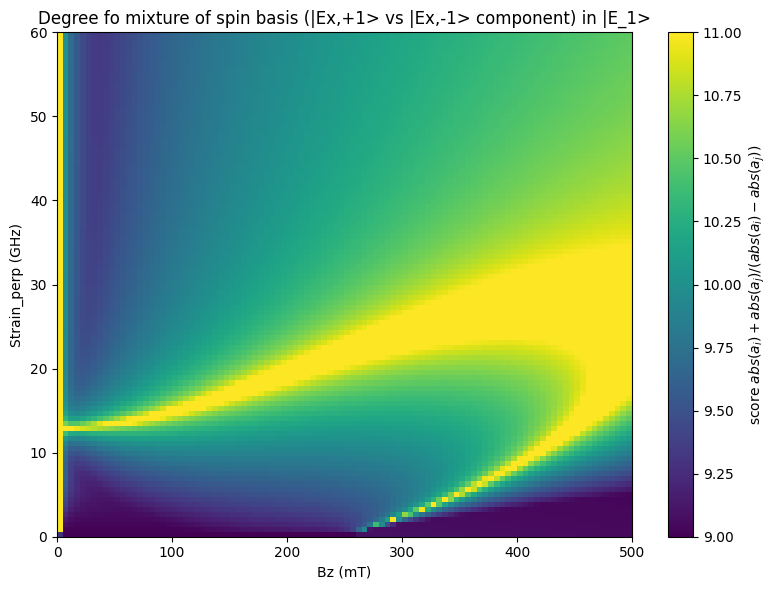

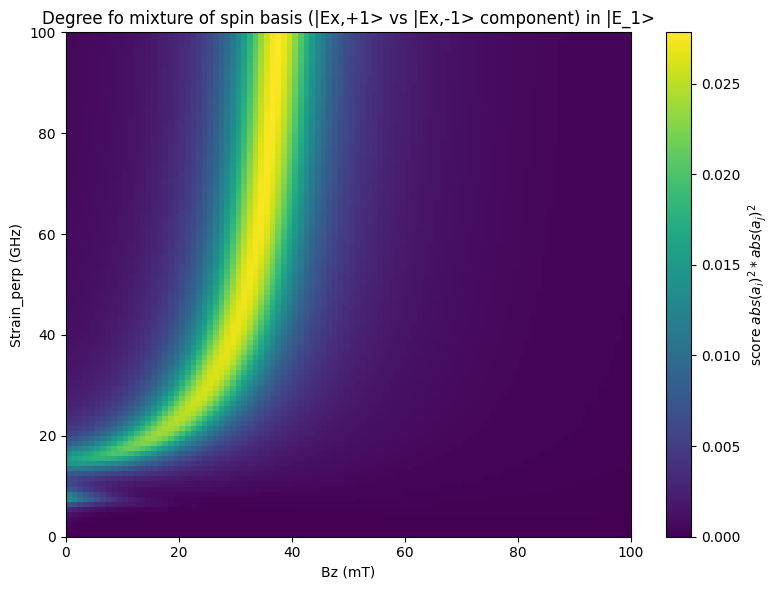

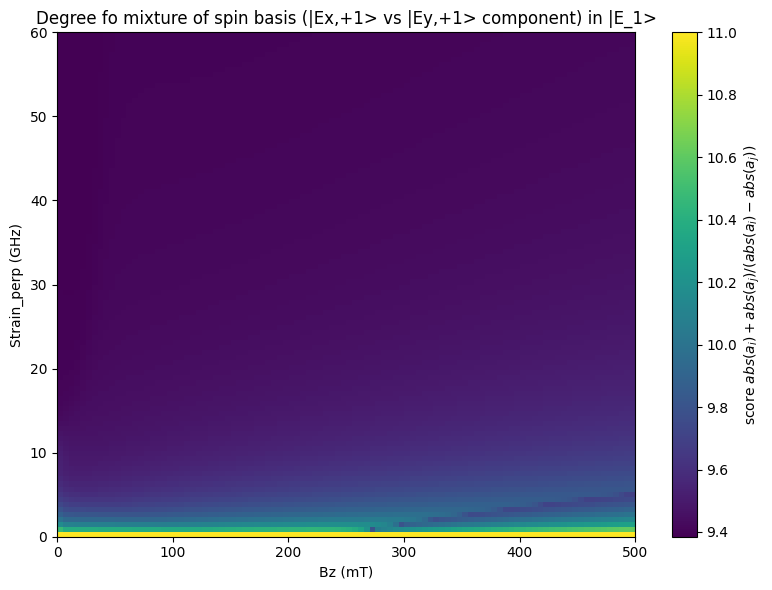

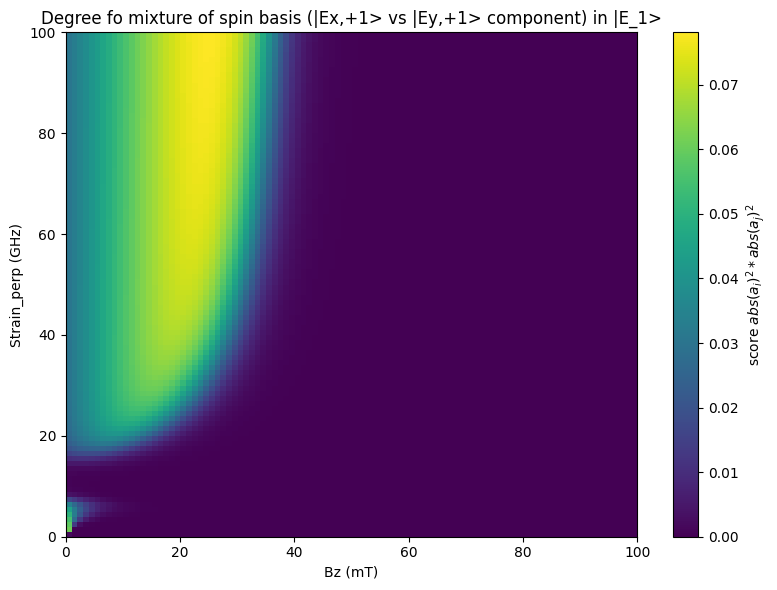

...

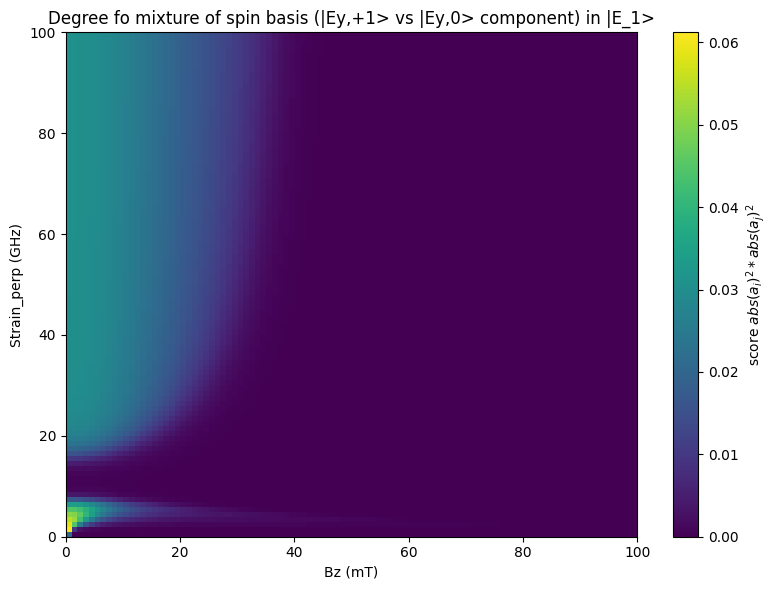

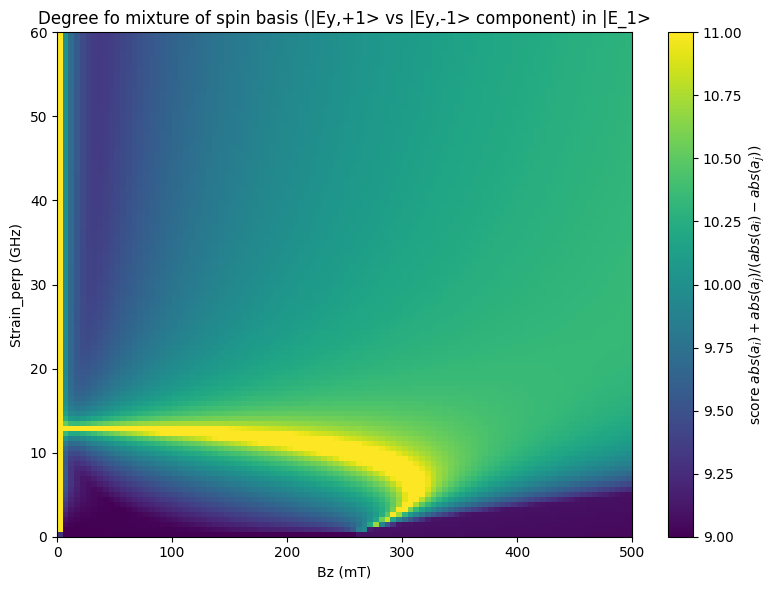

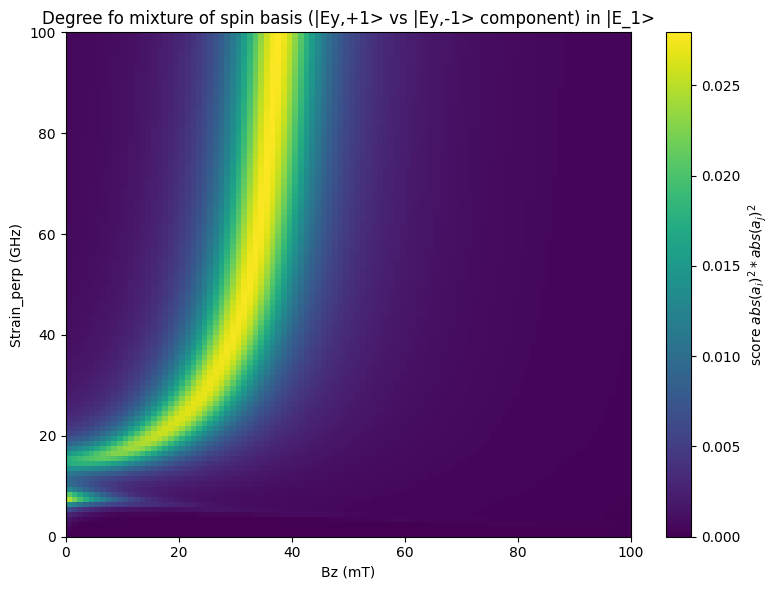

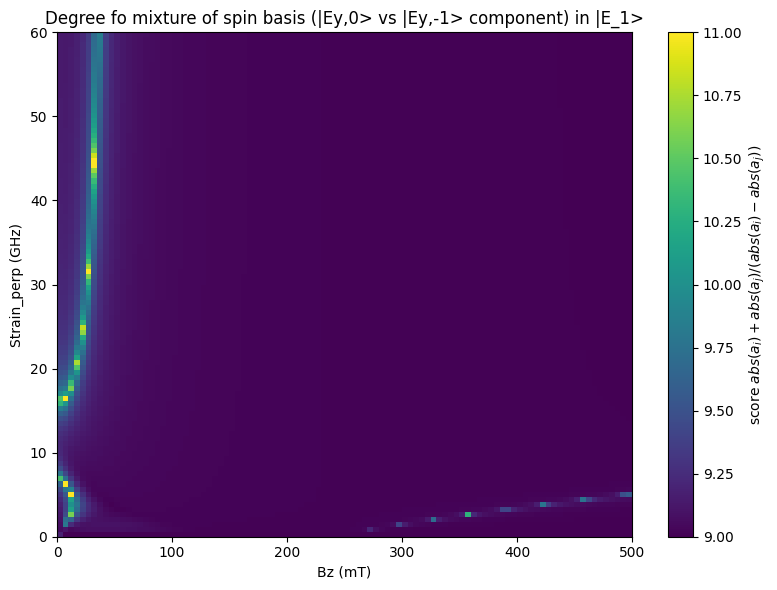

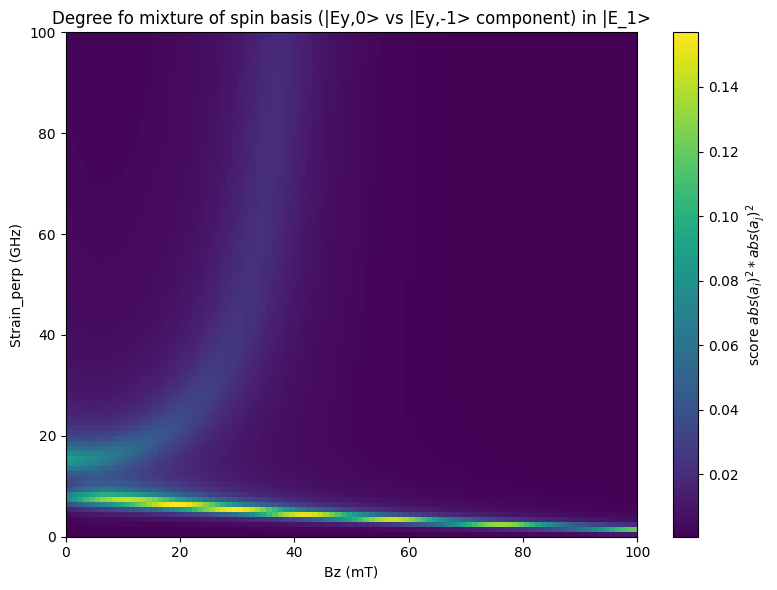

In [ ]:
s = 4
for i in range(0,6):
    for j in range(i,6):
        if i != j:
            making_colormap_spin_basis_Xi(s, i, j)
            making_colormap_spin_basis_Xi_pro(s, i, j)

C:\Users\Tsuchiya Saki\AppData\Local\Temp\ipykernel_23084\4038930024.py:34: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  score_map[k,w] = math.log10(score)


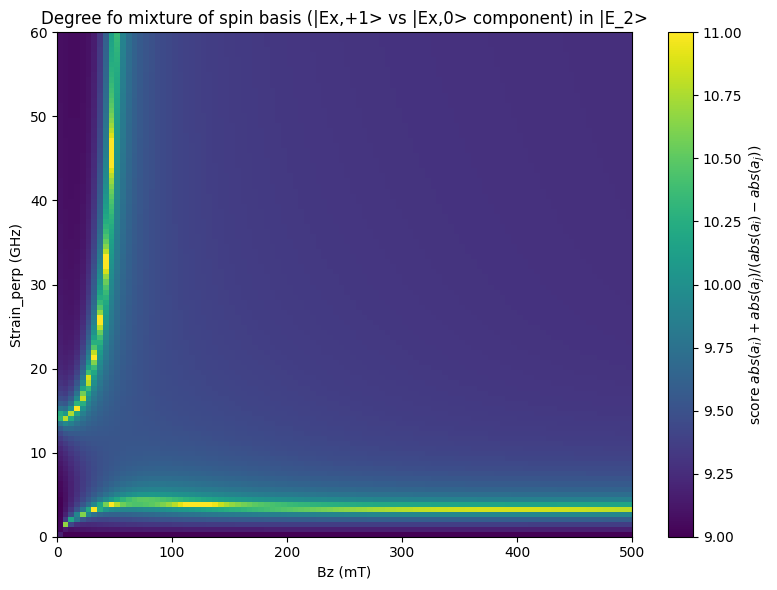

C:\Users\Tsuchiya Saki\AppData\Local\Temp\ipykernel_23084\88169367.py:27: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  score_map[k,w] = score


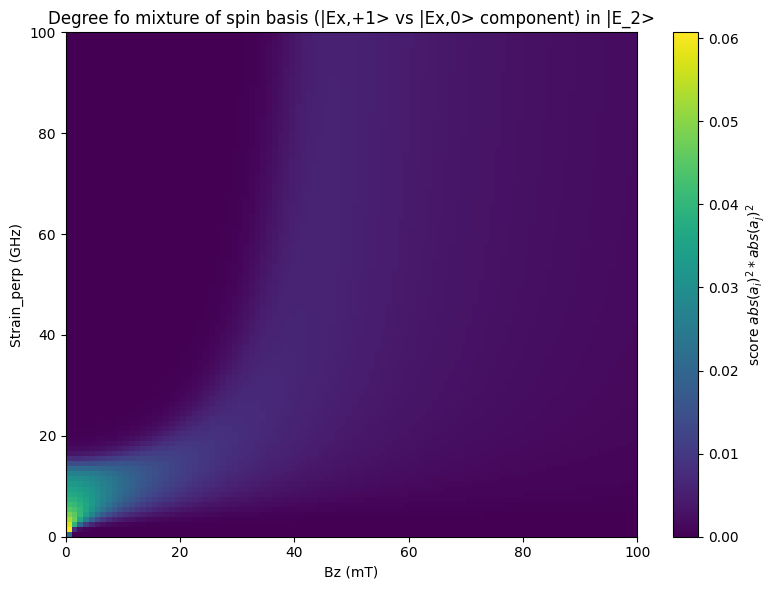

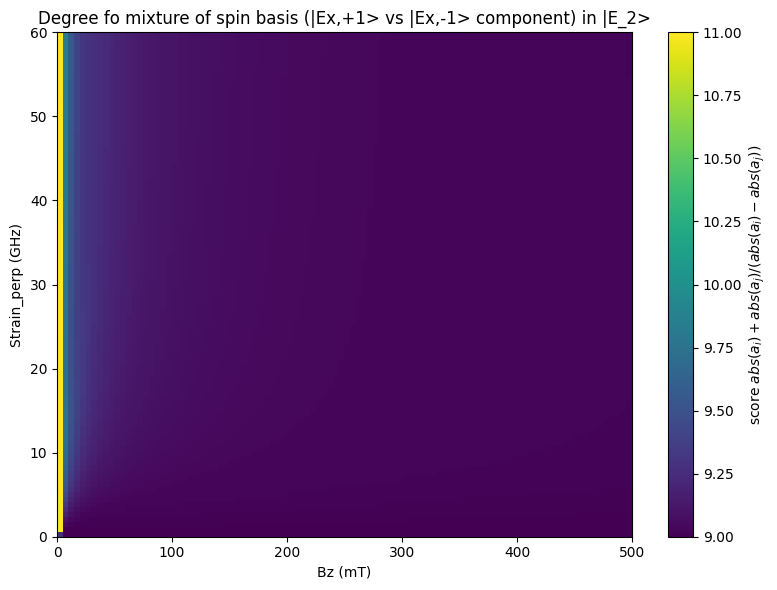

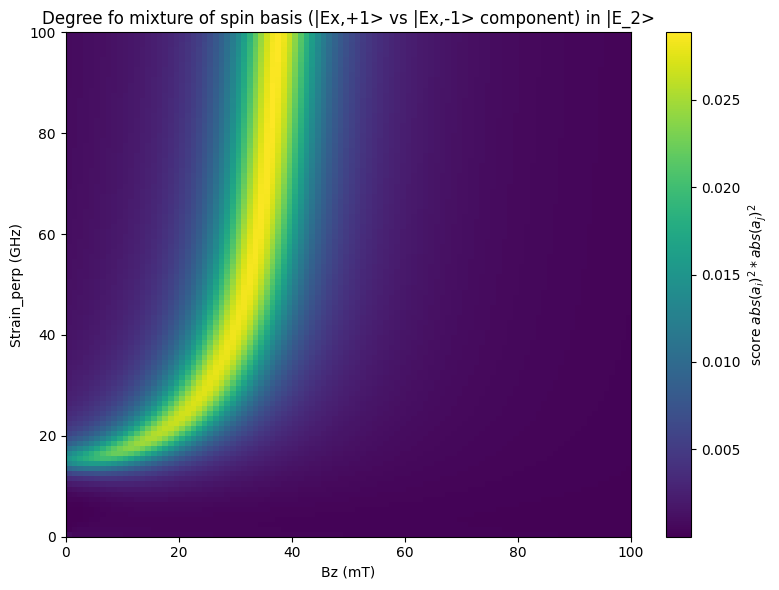

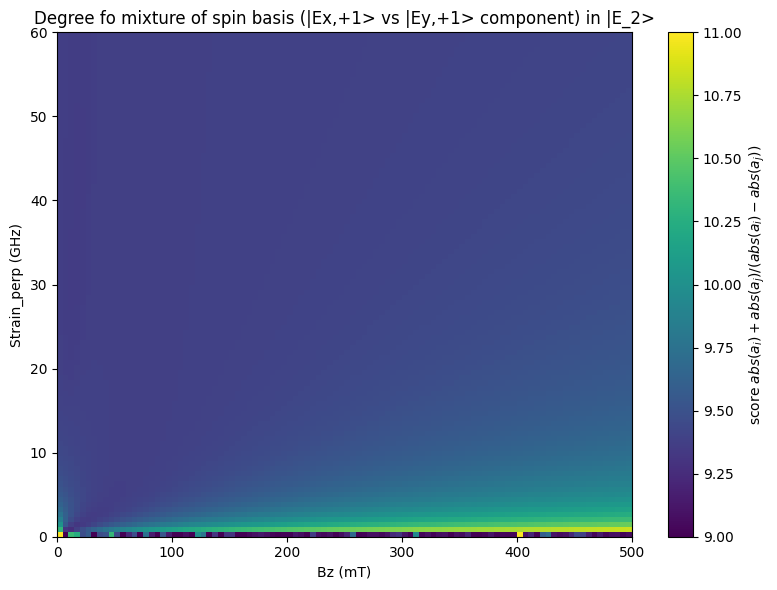

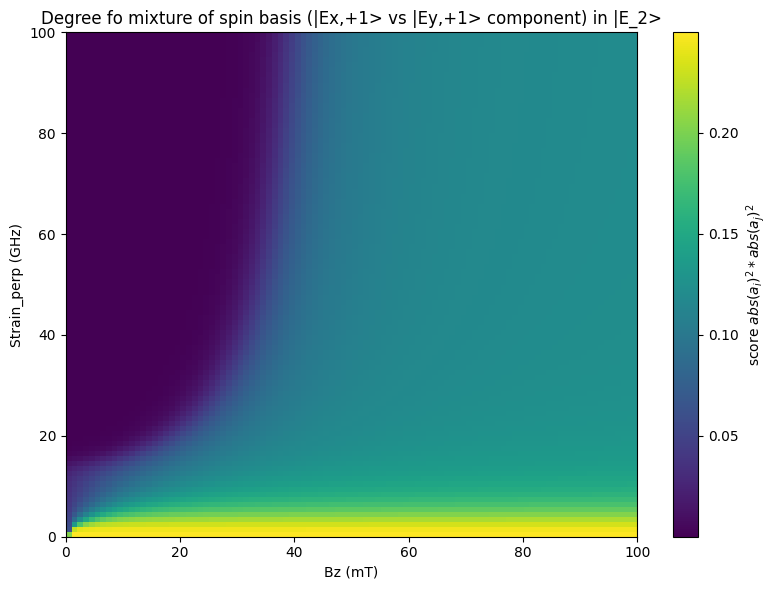

...

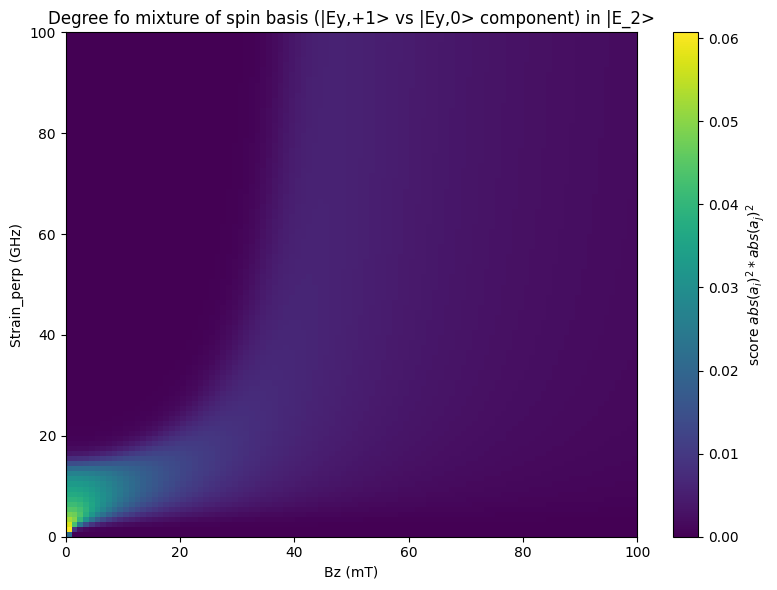

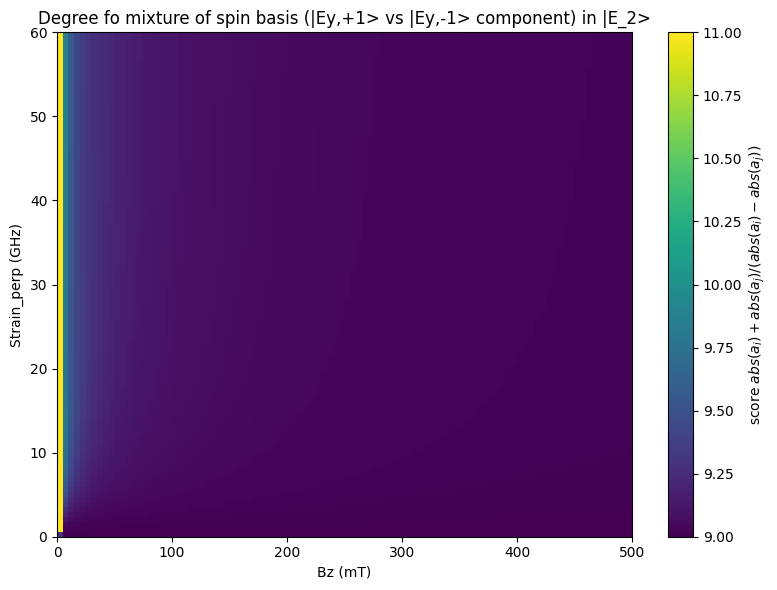

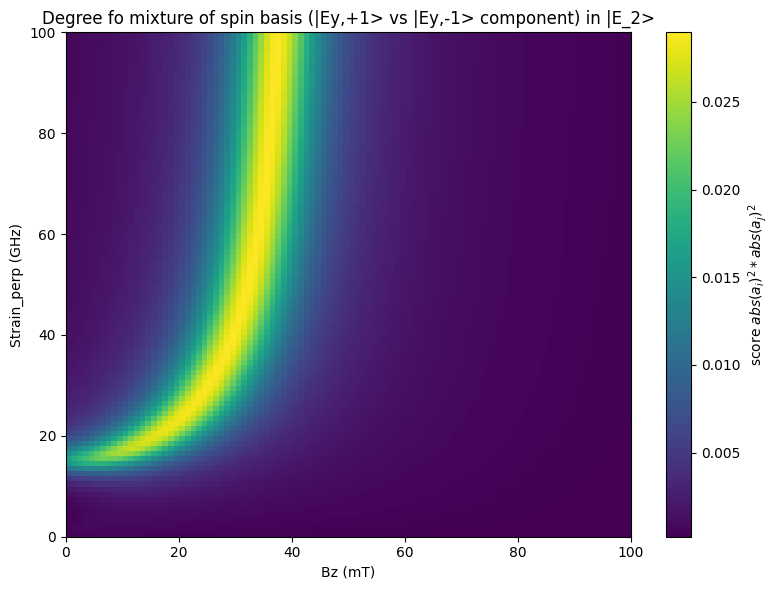

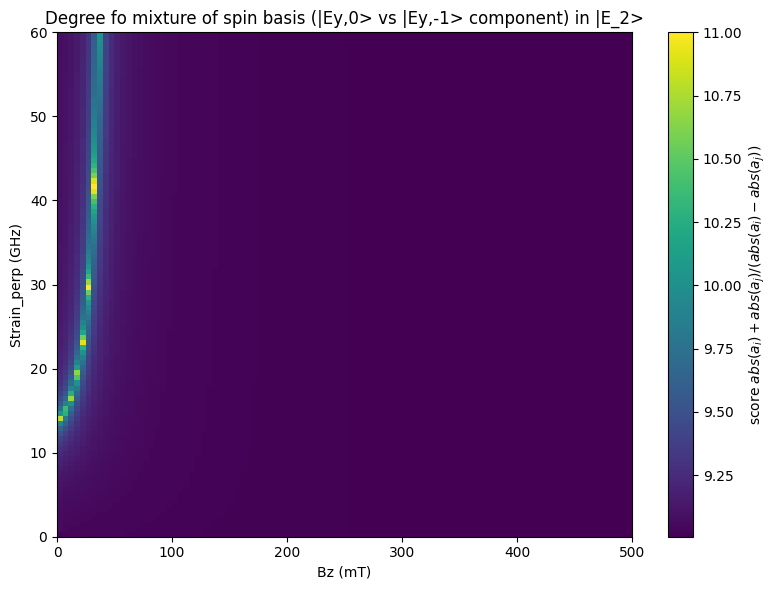

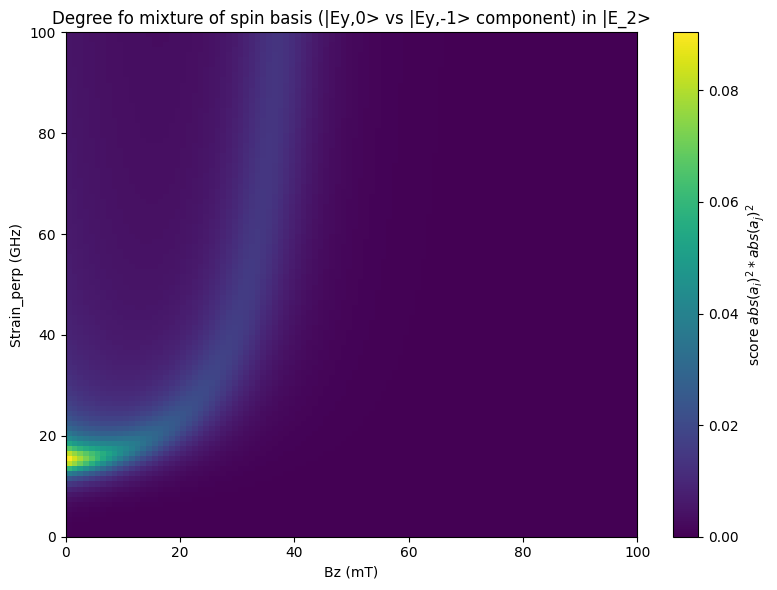

In [ ]:
s = 5
for i in range(0,6):
    for j in range(i,6):
        if i != j:
            making_colormap_spin_basis_Xi(s, i, j)
            making_colormap_spin_basis_Xi_pro(s, i, j)